<a href="https://colab.research.google.com/github/Ali-Banihashemi/ML-Algorithms-KNN-SVM-GBT-and-XGBoost/blob/main/AI-Assignment2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


#**Assignment 2-2024**



#**This notebook has four parts.**

#**[Part I]:  The K-Nearest Neighbors (KNN) Algorithm**
#**[Part II]: Support Vector Machines Algorithm**
#**[Part III]:  The Gradient-Boosting Algorithm.**
#**[Part IV]: Extreme Gradient Boosting(XGBoost)Algorithm**



The major part of this notebook has been constructed by Dr.Khoshnevisan and I've (Ali Banihashemi) just added some examples and I've done some editing.











In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from IPython.display import Image

#**Part I**

#**The K-Nearest Neighbors (KNN) Algorithm**
#**The KNN model is a supervised machine learning model. The kNN model is also one of the simpler models.**



#**Mathematical Definition of Nearest Neighbors**
#**The definition of nearest neighbors is based on the computation of the** **Euclidean distance from the new data point to each of the existing data**
$$ d(p,q) = \sqrt {{{({p_1} - {q_1})}^2} + {{({p_2} - {q_2})}^2} + ...{{({p_n} - {q_n})}^2}}$$

#**When we use the kNN algorithm, we need to identify the closest neighbors. Once we have identified the k neighbors that are closest to our new data point, we do not yet have a prediction. There is one step remaining to convert the multiple neighbors into one prediction. There are two prevalent methods for it.**


#**1.The first method is to take the average of the target value of the k nearest neighbors. This average is then used as the prediction**.

#**2.The second method is to take the weighted average of the k nearest neighbors and use their distances as the inverse weight so that closer points are weighted heavier in the prediction.**
#**Deciding on the Number of Neighbors k**
#**How many nearest neighbors should we include in the prediction? The value of k decides this. To apply this, let us see two cases – one nearest neighbor and three nearest neighbors – and see the difference in prediction. The two are given in the figure below**



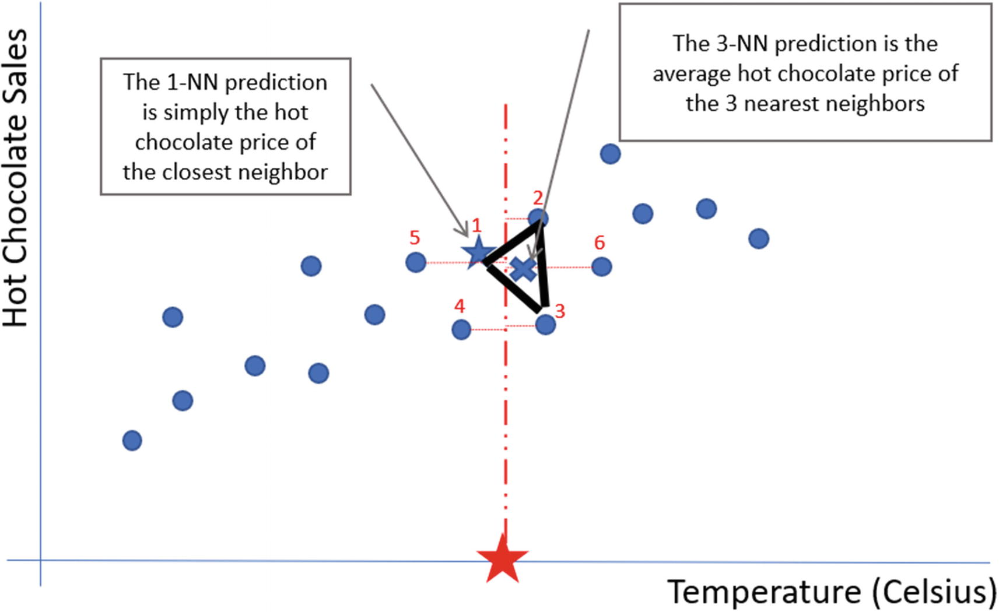

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/KNN.jpg', width=900,height=600)

## **Let's Take a look at this simple classification example:**

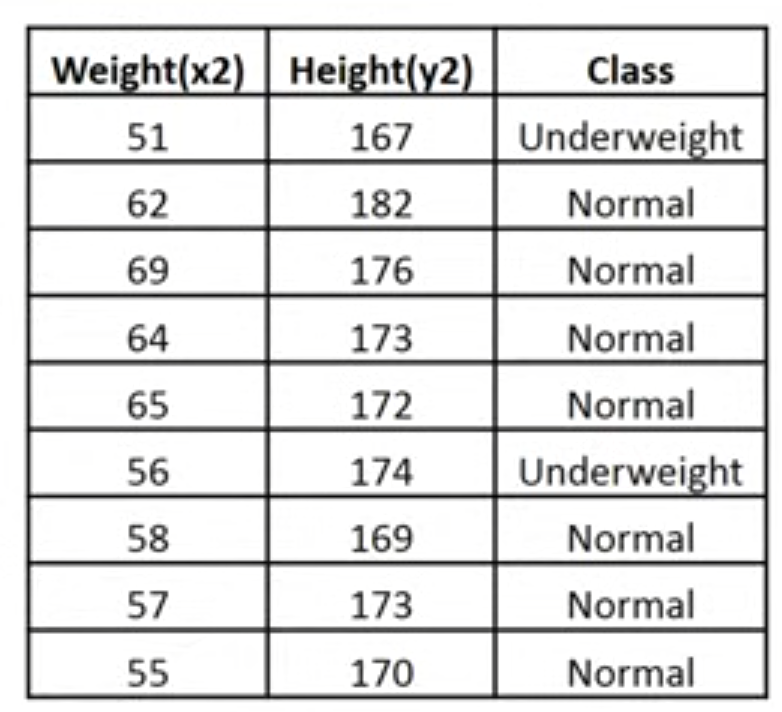

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/KNN-EX1.png', width=400,height=400)

Suppose we have a dataset of people which every person in this dataset has 2 features; Weight and Height. There are 2 classes or labels; Underweight or Normal. Now we are going to classify this dataset using KNN algorithm.

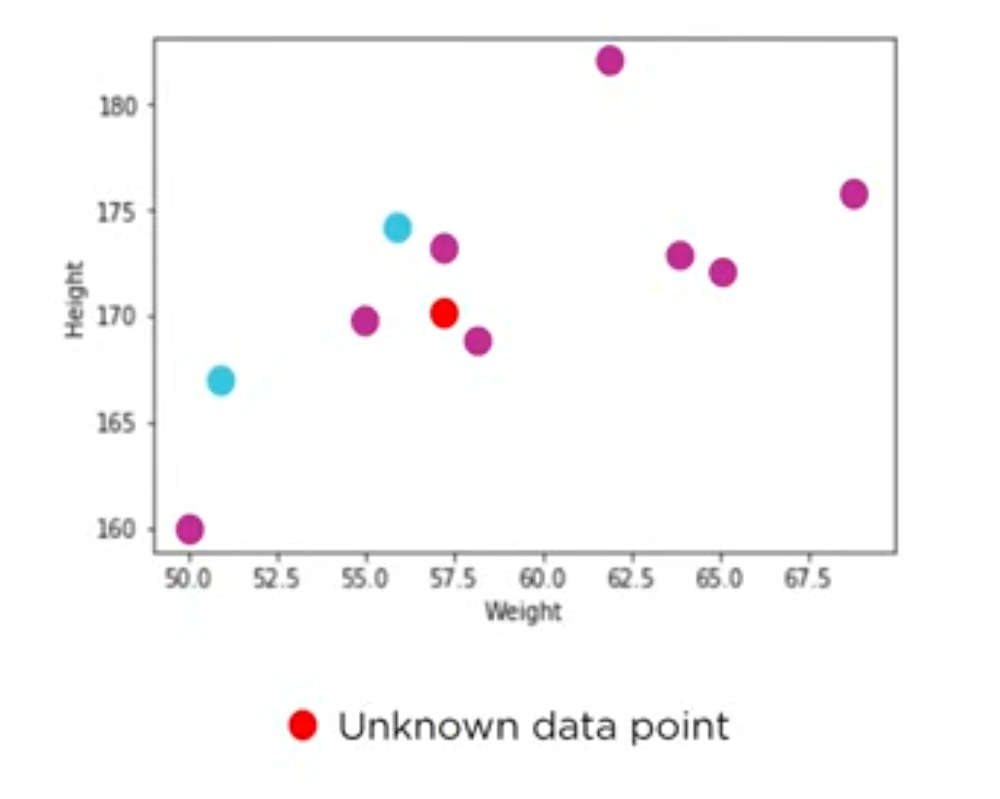

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/KNN-EX2.png', width=500,height=400)

Here we have a new unknow data which we want to classify. For better understanding we have shown the whole dataset on a 2D graph.

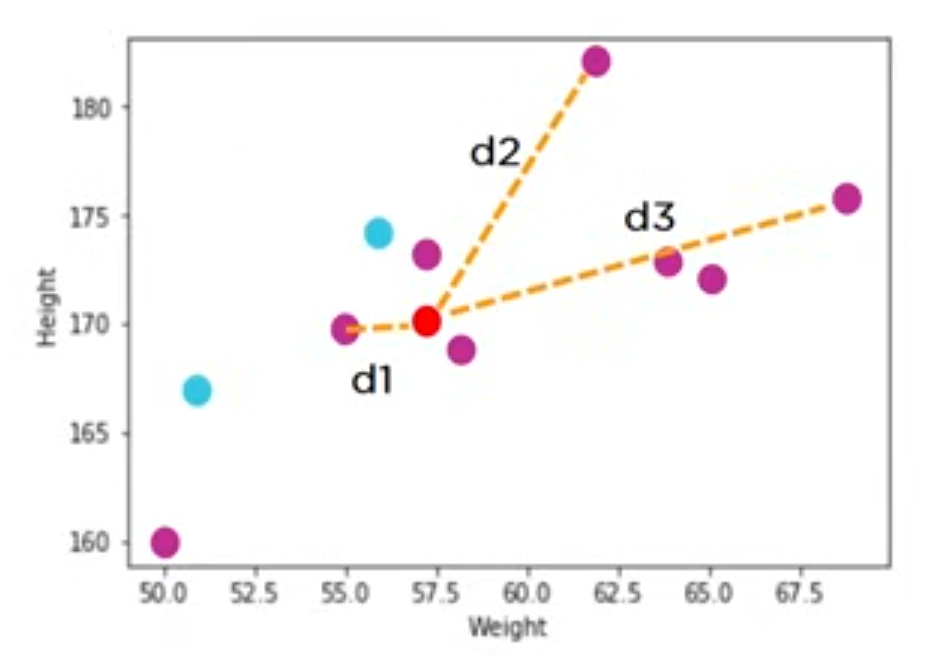

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/KNN-EX3.png', width=500,height=350)

To classify a new datapoint we should first find the euclidean distances between this single new data and all the points available in the dataset. We should consider that usually we don't use KNN for big datasets so computation time is not a concern in this case. Here we have only 2 features but for any number of features we should just take the square root of the sum of the diffrences between all the features of 2 data to calculate this 2 datas' euclidean distance.

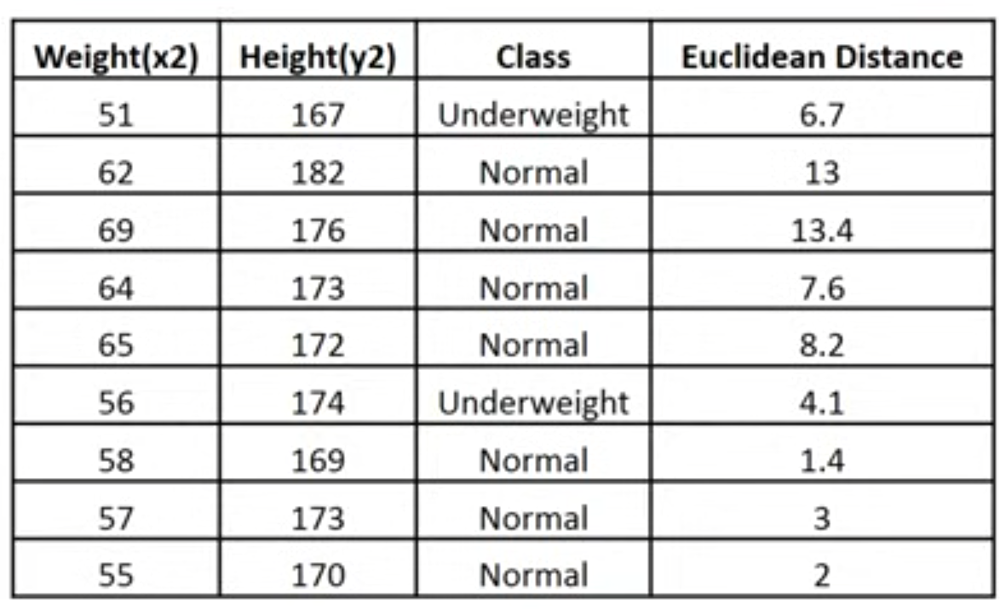

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/KNN-EX4.png', width=500,height=400)

In this table the new column simply shows the euclidean distance of each data point in the dataset with the new data point. Now we should find the K nearest neighbours of this new data point using these distances.

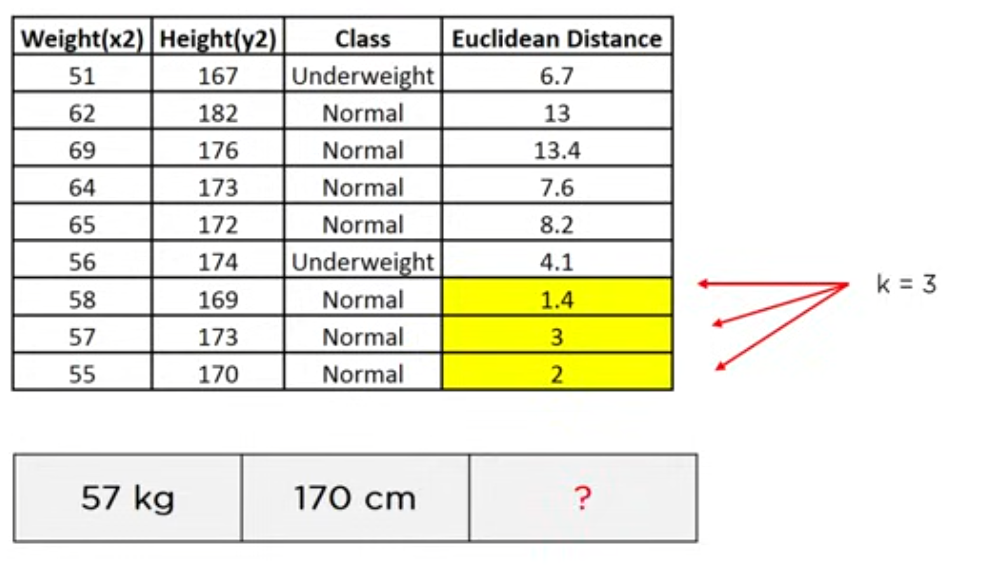

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/KNN-EX5.png', width=600,height=400)

If we have K = 3 , then there is a simple conclusion. As all these 3 nearest neighbours are classified as normal, we predict this new data as normal as well. In other cases we may have k nearest neighbours with different classes and we take the most common class among them as the prediction. Also we consider choosing an odd number for the K so we won't have same votes for different classes in the K nearest neighbours.

#**1.Import libraries.**

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt

#**2. Import the traffic data.**

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/AI-Assignment2/Metro_Interstate_Traffic_Volume.csv')

In [ ]:
data.head()

,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,date_time,traffic_volume
0,NaN,288.28,0.0,0.0,40,Clouds,scattered clouds,2012-10-02 09:00:00,5545
1,NaN,289.36,0.0,0.0,75,Clouds,broken clouds,2012-10-02 10:00:00,4516
2,NaN,289.58,0.0,0.0,90,Clouds,overcast clouds,2012-10-02 11:00:00,4767
3,NaN,290.13,0.0,0.0,90,Clouds,overcast clouds,2012-10-02 12:00:00,5026
4,NaN,291.14,0.0,0.0,75,Clouds,broken clouds,2012-10-02 13:00:00,4918


#**3. The seasonality variables are necessary for the modeling here. We create Year, Month, Weekday, Hour, IsHoliday.**

In [ ]:
data['year'] = data['date_time'].apply(lambda x: x[:4])
data['month'] = data['date_time'].apply(lambda x: x[5:7])
data['weekday'] = pd.to_datetime(data['date_time']).apply(lambda x: x.weekday())
data['hour'] = pd.to_datetime(data['date_time']).apply(lambda x: x.hour)
data['isholiday'] = (data['holiday'] == 'None').apply(float)


In [ ]:
data.tail()

,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,date_time,traffic_volume,year,month,weekday,hour,isholiday
48199,NaN,283.45,0.0,0.0,75,Clouds,broken clouds,2018-09-30 19:00:00,3543,2018,09,6,19,0.0
48200,NaN,282.76,0.0,0.0,90,Clouds,overcast clouds,2018-09-30 20:00:00,2781,2018,09,6,20,0.0
48201,NaN,282.73,0.0,0.0,90,Thunderstorm,proximity thunderstorm,2018-09-30 21:00:00,2159,2018,09,6,21,0.0
48202,NaN,282.09,0.0,0.0,90,Clouds,overcast clouds,2018-09-30 22:00:00,1450,2018,09,6,22,0.0
48203,NaN,282.12,0.0,0.0,90,Clouds,overcast clouds,2018-09-30 23:00:00,954,2018,09,6,23,0.0



#**4A. Feature engineering to create the additional explanatory variables.**
#**4B. Split the data into train and test and fit a default kNN model.**
#**4C. Obtain the R2**


In [ ]:
X = data[['year', 'month', 'weekday', 'hour', 'isholiday']]
y = data['traffic_volume']
X.head()

,year,month,weekday,hour,isholiday
0,2012,10,1,9,0.0
1,2012,10,1,10,0.0
2,2012,10,1,11,0.0
3,2012,10,1,12,0.0
4,2012,10,1,13,0.0


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=100, random_state=12345, shuffle=False)
my_dt = KNeighborsRegressor()
my_dt.fit(X_train, y_train)
fcst = my_dt.predict(X_test)
print(r2_score(list(y_test), list(fcst)))

0.970238265560862


#**5. Verify our results visually.**

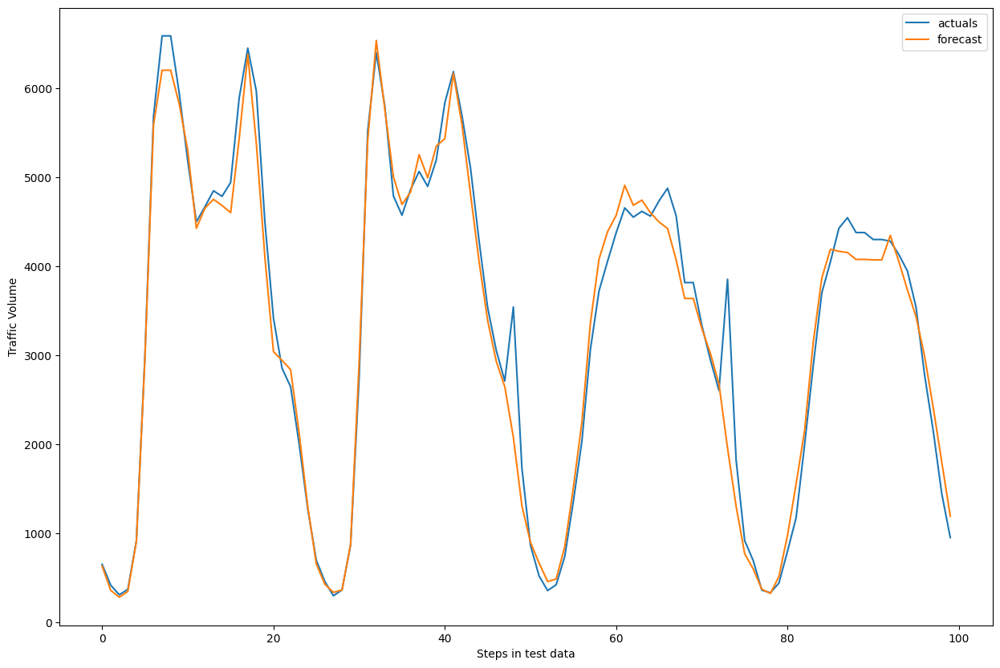

In [ ]:
plt.figure(figsize=(15,10))
plt.plot(list(y_test))
plt.plot(list(fcst))
plt.legend(['actuals', 'forecast'])
plt.ylabel('Traffic Volume')
plt.xlabel('Steps in test data')
plt.show()


#**Part II**
#**Support Vector Machines Algorithm**

#**1.The fundamental idea behind Support Vector Machines is to fit the largest possible street/margin between the decision boundary that separates the two classes and the training instances. When performing soft margin classification, the SVM searches for a compromise between perfectly separating the two classes and having the widest possible margin. Another key idea is to use kernels when training on nonlinear datasets.**

#**2.The decision boundary is entirely determined by the support vectors. Any instance that is not a support vector (i.e., is off the street/margin) has no influence whatsoever; you could remove them, add more instances, or move them around, and as long as they stay off the street, they will not affect the decision boundary. Computing the predictions only involve the support vectors, not the whole training set.**

#**3.SVMs will fit the largest possible “street” between the classes (see the first answer), so if the training set is not scaled, the SVM will tend to neglect small features (see Figure below this cell).**

#**4.The SVM classifier can output the distance between the test instance and the decision boundary. We can use this as a confidence score. However, this score cannot be directly converted into an estimation of the class probability. If you set probability=True when creating an SVM in Scikit-Learn, then after training, it will calibrate the probabilities using Logistic Regression on the SVM’s scores (trained by an additional five-fold cross-validation on the training data). This will add the predict_proba() and predict_log_proba() methods to the SVM.**



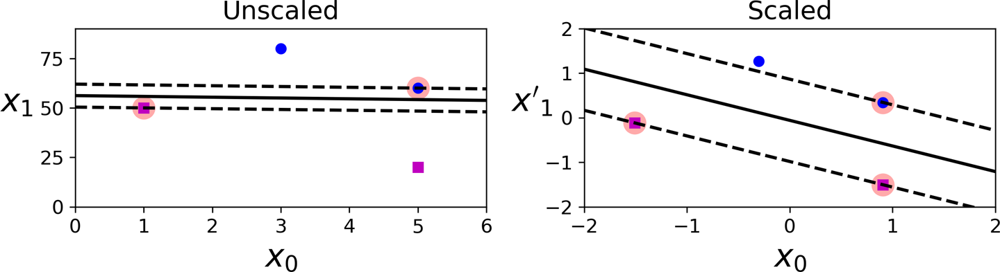

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/SVM.png', width=900,height=500)

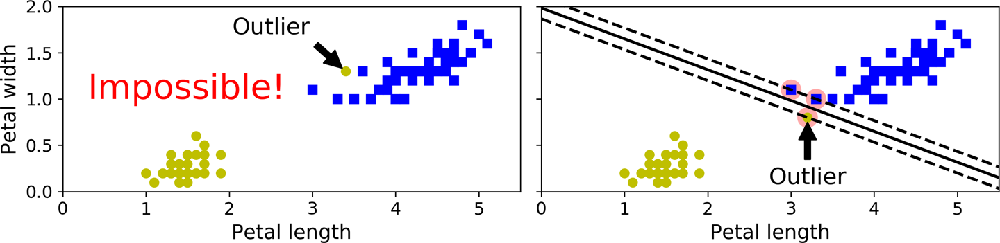

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/SVM-1.png', width=900,height=500)

#**Soft Margin Classification**
#**If we strictly impose that all instances must be off the street and on the right side, this is called hard margin classification. There are two main issues with hard margin classification. First, it only works if the data is linearly separable. Second, it is sensitive to outliers. The above figure(SVM-1) shows the iris dataset with just one additional outlier: on the left, it is impossible to find a hard margin; on the right, the decision boundary ends up very different from the one in the Figure below (SVM-2) without the outlier, and it will probably not generalize as well. To avoid these issues, we use a more flexible model. The objective is to find a good balance between keeping the street as large as possible and limiting the margin violations (i.e., instances that end up in the middle of the street or even on the wrong side). This is called soft margin classification.**


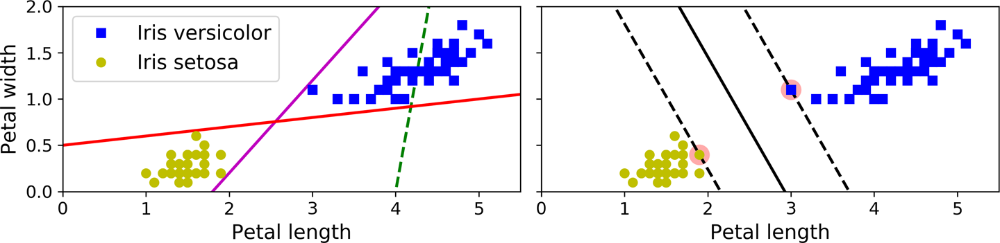

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/SVM-2.png', width=900,height=500)

#**Nonlinear SVM Classification**
#**Although linear SVM classifiers are efficient and work  well in many cases, many datasets are not even close to being linearly separable. One approach to handling nonlinear datasets is to add more features, such as polynomial features. In some cases, this can result in a linearly separable dataset. Consider the left plot in Figure 5-5: it represents a simple dataset with just one feature, ${x_1}$.This dataset is not linearly separable( Figure below=SVM-3). But if you add a second feature  ${x_2} = {({x_1})^2}$ , the resulting 2D dataset is perfectly linearly separable.**


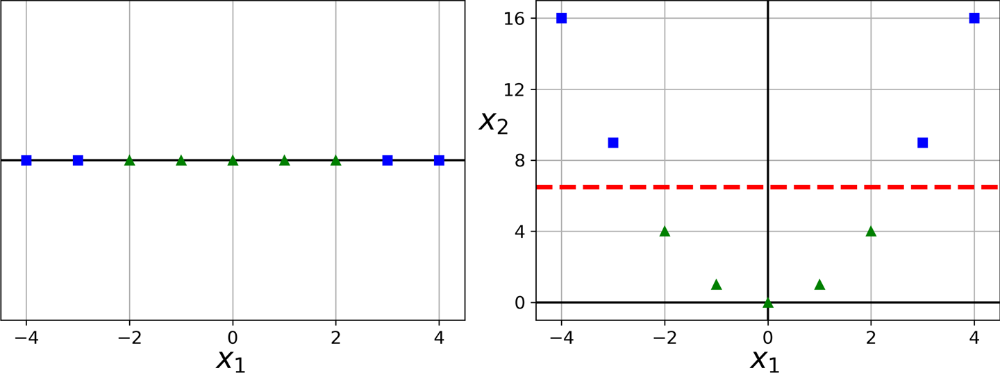

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/SVM-3.png', width=900,height=400)

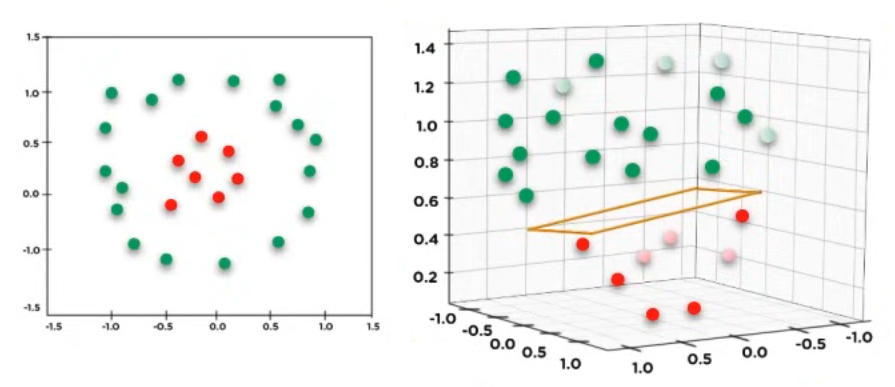

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/SVM-EX6.png', width=900,height=400)

We can have te same results by transforming from a 2D space to 3D and so on.

Now, Let's see our example.

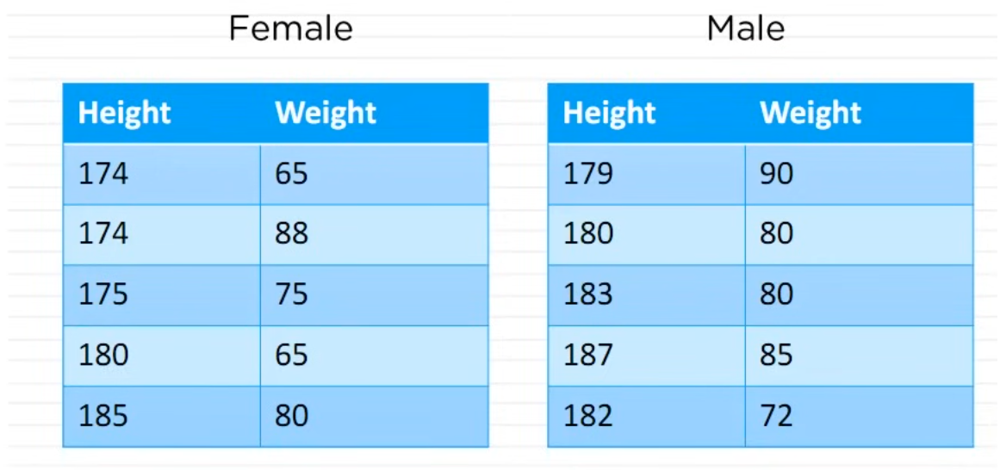

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/SVM-EX1.png', width=900,height=400)

In this example we have another height and weight based dataset. In this one however the labels are Either female or male.

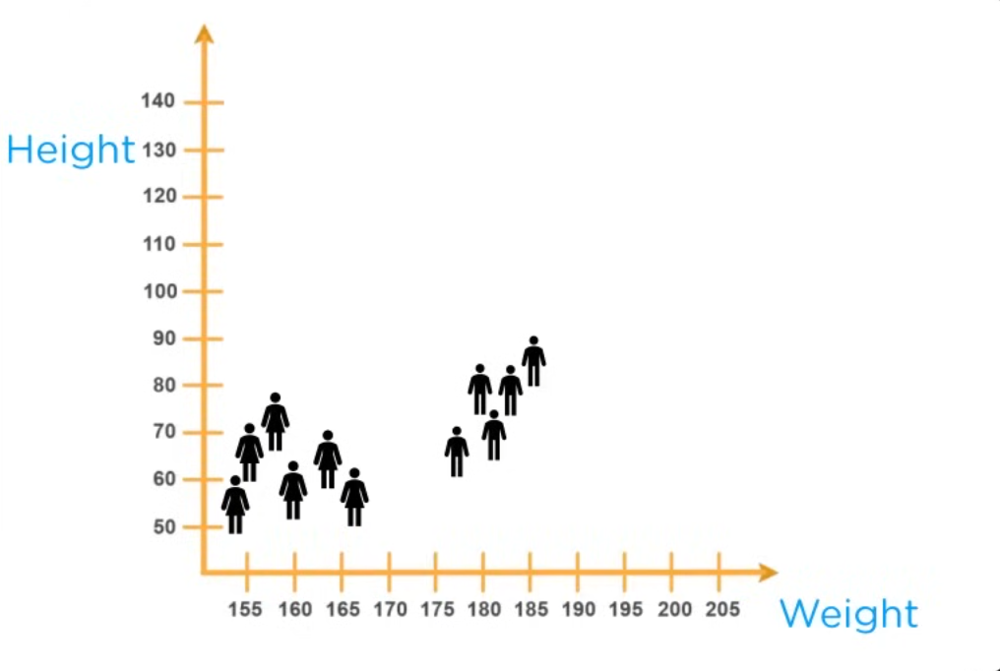

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/SVM-EX2.png', width=600,height=400)

Here we can see how our datas form clusters on a 2D graph.

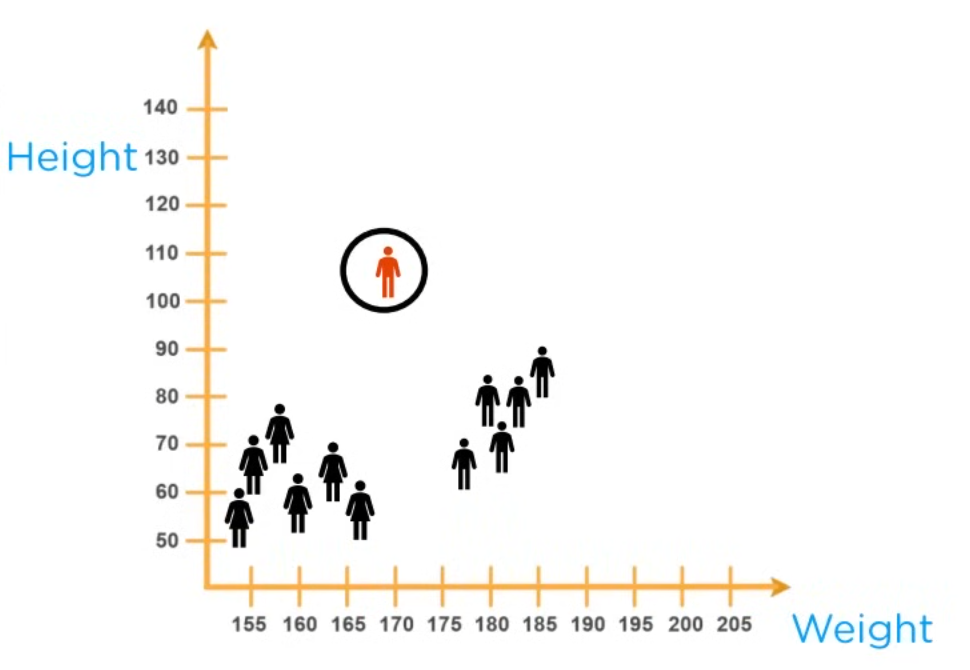

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/SVM-EX3.png', width=600,height=400)

Suppose we have a new data point and we want to classify it.

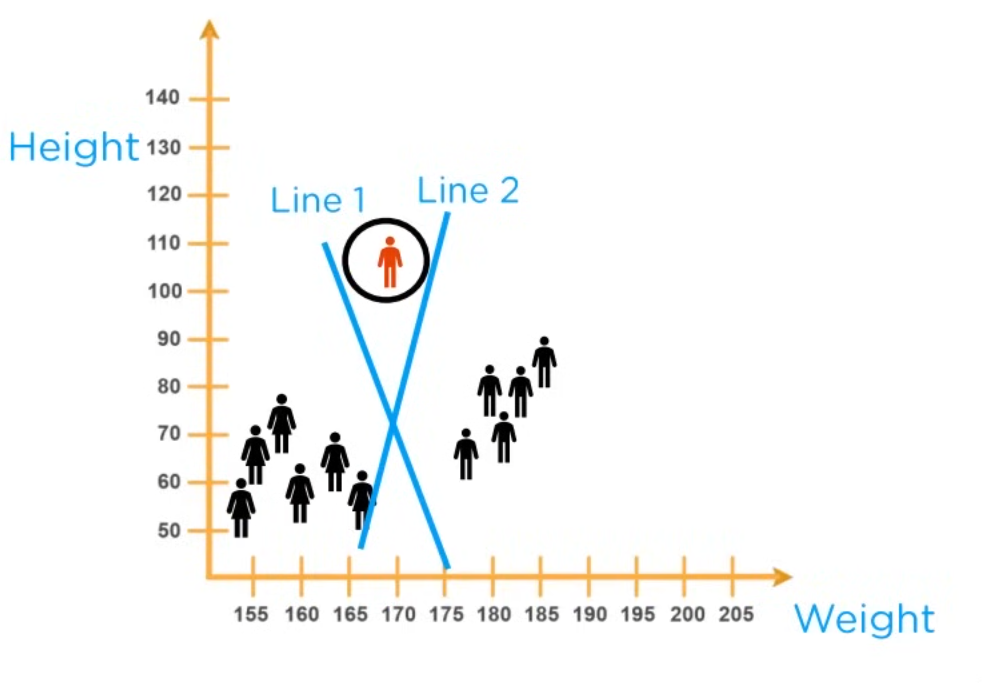

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/SVM-EX4.png', width=600,height=400)

Which line should we choose? Should we tell this new data is a male based on line 1 seperation or it is a femal based on line 2 seperation. SVM gives us a straight forward solution.

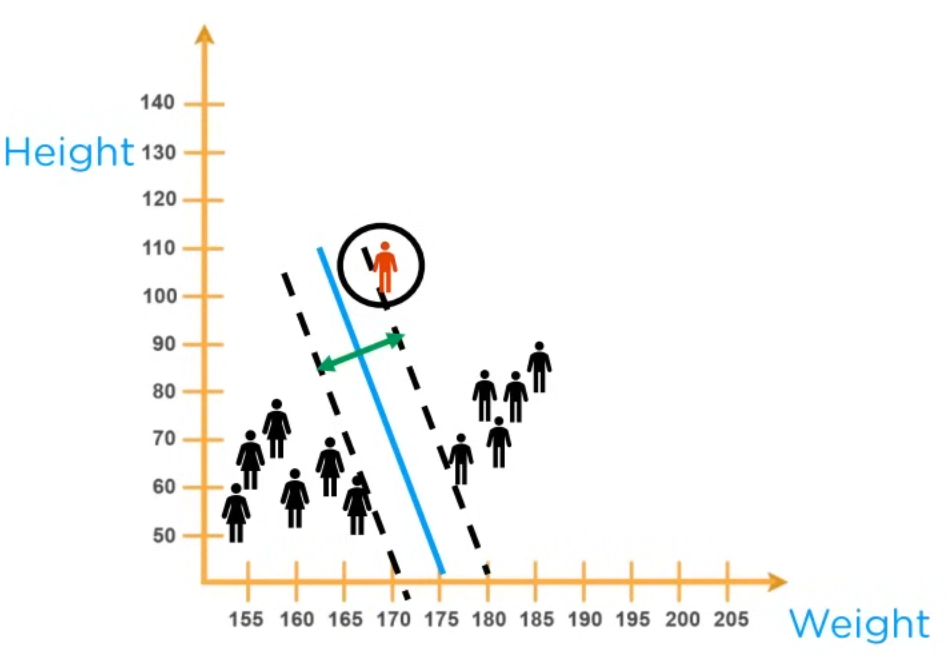

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/SVM-EX5.png', width=600,height=400)

In this algorithm we want to choose a line for seperating our data in a way that both classes have the most possible distance with this line. In other words we want to fit the thickest street possible between this two classes. The female and the male who are near dashed lines are the support vectors. These two are the most important data points in this example for this algorithm. We can add as much tall and heavy males and as much short and thin females to these data and they won't change our SVM seperation. Howevere this was an ideal dataset. In reality we can have females taller and heavier than some males. In that case the fitting would be much more challenging. We can say those could be outliers or maybe we could not seperate these two classes with only two features and we may need another feature like body fat percentage or something like that to seperate them better.

#**Model 1**

#**1.Import libraries.**

In [ ]:
from sklearn.datasets import load_iris
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score

#**2. We load our data.**

In [ ]:
dataset = load_iris()
data = dataset.data
target = dataset.target

#**3. We perform preprocessing on our data.**

In [ ]:
sc = StandardScaler()
sc.fit_transform(data)

array([[-9.00681170e-01,  1.01900435e+00, -1.34022653e+00,
        -1.31544430e+00],
       [-1.14301691e+00, -1.31979479e-01, -1.34022653e+00,
        -1.31544430e+00],
       [-1.38535265e+00,  3.28414053e-01, -1.39706395e+00,
        -1.31544430e+00],
       [-1.50652052e+00,  9.82172869e-02, -1.28338910e+00,
        -1.31544430e+00],
       [-1.02184904e+00,  1.24920112e+00, -1.34022653e+00,
        -1.31544430e+00],
       [-5.37177559e-01,  1.93979142e+00, -1.16971425e+00,
        -1.05217993e+00],
       [-1.50652052e+00,  7.88807586e-01, -1.34022653e+00,
        -1.18381211e+00],
       [-1.02184904e+00,  7.88807586e-01, -1.28338910e+00,
        -1.31544430e+00],
       [-1.74885626e+00, -3.62176246e-01, -1.34022653e+00,
        -1.31544430e+00],
       [-1.14301691e+00,  9.82172869e-02, -1.28338910e+00,
        -1.44707648e+00],
       [-5.37177559e-01,  1.47939788e+00, -1.28338910e+00,
        -1.31544430e+00],
       [-1.26418478e+00,  7.88807586e-01, -1.22655167e+00,
      

#**4. We do train test split.**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(data, target, random_state=42, test_size=0.15)

#**5. We train our model.**

In [ ]:
model = SVC()
model.fit(X_train,y_train)

SVC()

#**6. We compute the accuracy score on our test data.**

In [ ]:
accuracy_score(y_test, model.predict(X_test))

1.0

#**Model 2**

#**1.Import libraries.**

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')


#**2. We load our data.**

In [ ]:
titanic = pd.read_csv('/content/drive/MyDrive/AI-Assignment2/final_dataset_ready.csv')
dataset = titanic.copy()
X = np.asarray(dataset.drop('Survived', axis=1))
y = np.asarray(dataset['Survived'])
y[y==0] = -1
X.shape
titanic.head()


,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked_C,Embarked_Q,Embarked_S
0,0,3,1,22.0,1,0,7.2500,0,0,1
1,1,1,0,38.0,1,0,71.2833,1,0,0
2,1,3,0,26.0,0,0,7.9250,0,0,1
3,1,1,0,35.0,1,0,53.1000,0,0,1
4,0,3,1,35.0,0,0,8.0500,0,0,1


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
X_train.shape
print(X_test.shape,y_test.shape)

(179, 9) (179,)


#**4. We perform preprocessing on our data.**

In [ ]:
sc = StandardScaler()
X_train_normalized = sc.fit_transform(X_train)
X_test_normalized = sc.transform(X_test)

#**5. We train our model.**

In [ ]:
svmModel = SVC(kernel = 'rbf',C=2,gamma = 0.9)
svmModel.fit(X_train_normalized,y_train)

SVC(C=2, gamma=0.9)

#**6. We use our model to predict our test data.**

In [ ]:
Y_pred = svmModel.predict(X_test_normalized)
print(round(accuracy_score(y_test, Y_pred)*100,2))

80.45



#**Part III**

# **The Gradient-Boosting Algorithm**

# **Gradient-Boosted Tree (GBT) is another tree-based ensemble algorithm similar to Random Forest. GBTs use a technique known as boosting to create a strong learner from weak learners (shallow trees). GBTs train an ensemble of decision trees sequentially, with each succeeding tree decreasing the error of the previous tree. This is done by using the residuals of the previous model to fit the next model. This residual-correction process is performed a set number of iterations with the number of iterations determined by cross-validation until the residuals have been fully minimized.**








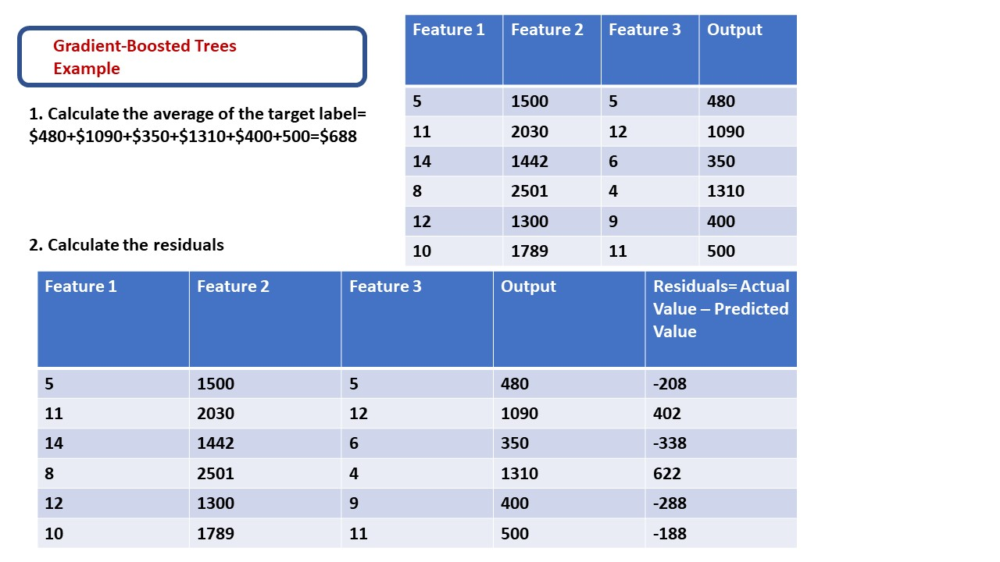

In [ ]:
from IPython.display import Image
Image(filename='/content/drive/MyDrive/AI-Assignment2/GBoost0.jpg', width=900,height=600)

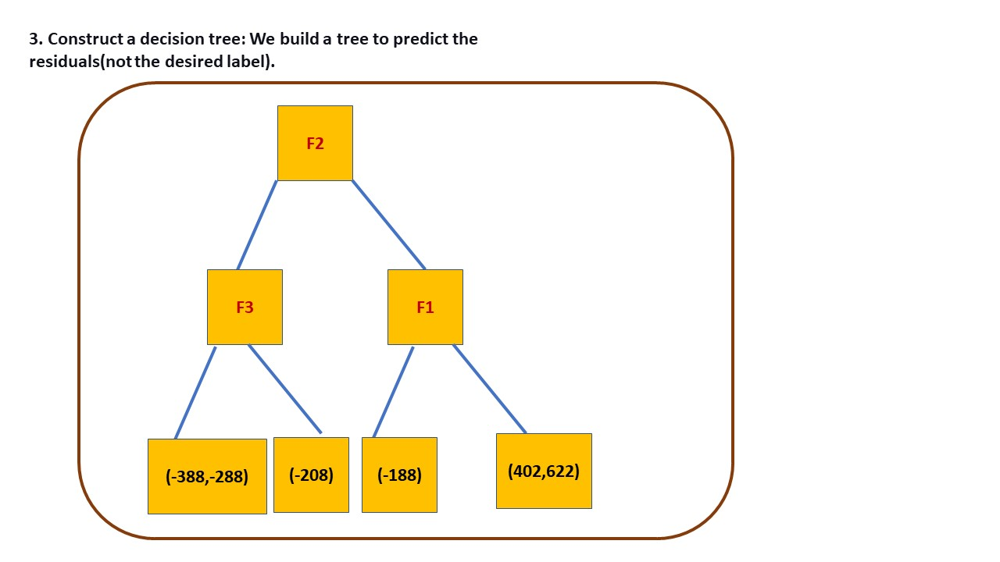

In [ ]:
from IPython.display import Image
Image(filename='/content/drive/MyDrive/AI-Assignment2/GBoost1.jpg', width=900,height=600)

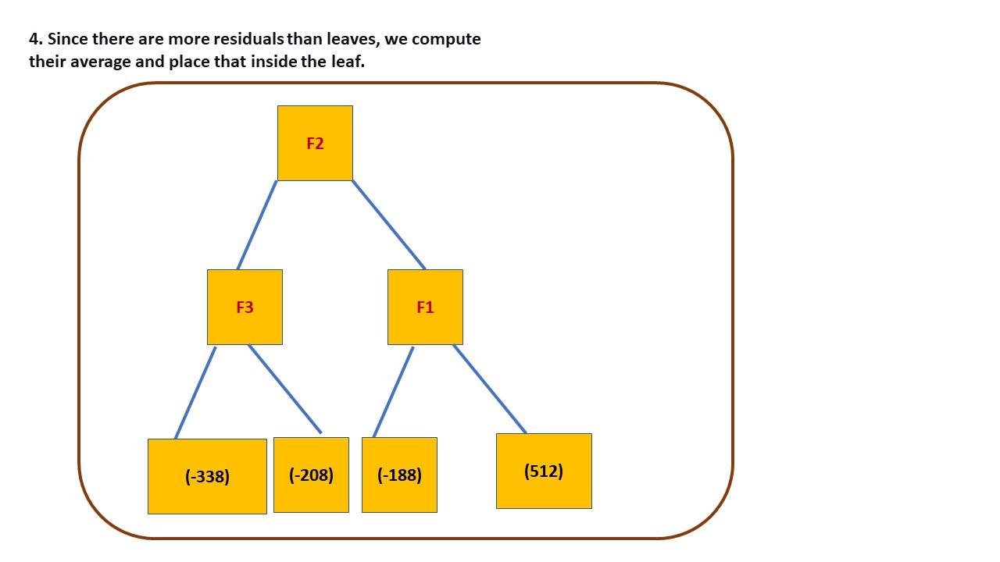

In [ ]:
from IPython.display import Image
Image(filename='/content/drive/MyDrive/AI-Assignment2/GBoost2.jpg', width=900,height=600)

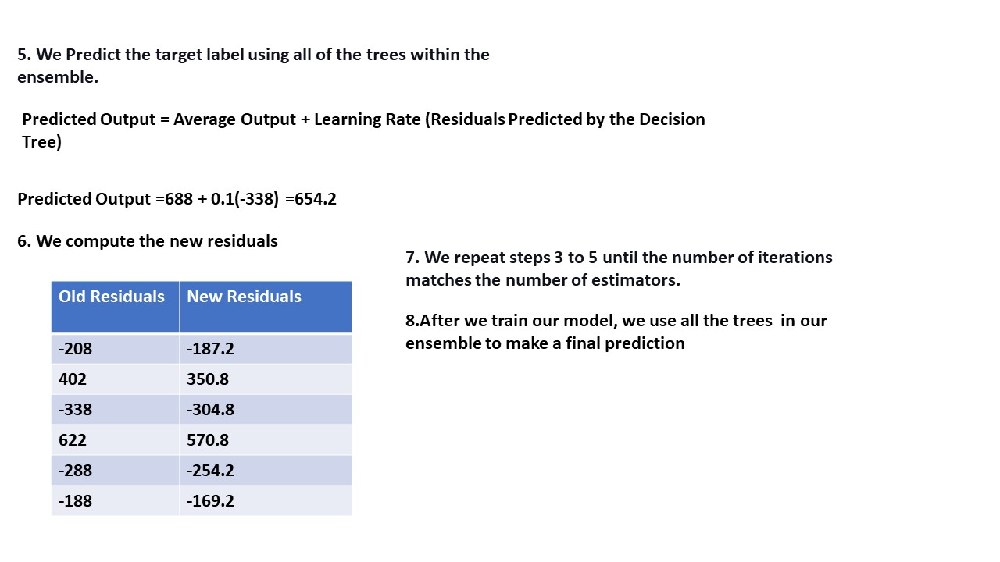

In [ ]:
from IPython.display import Image
Image(filename='/content/drive/MyDrive/AI-Assignment2/Gboost3.jpg', width=900,height=600)

## **Here is another example:**

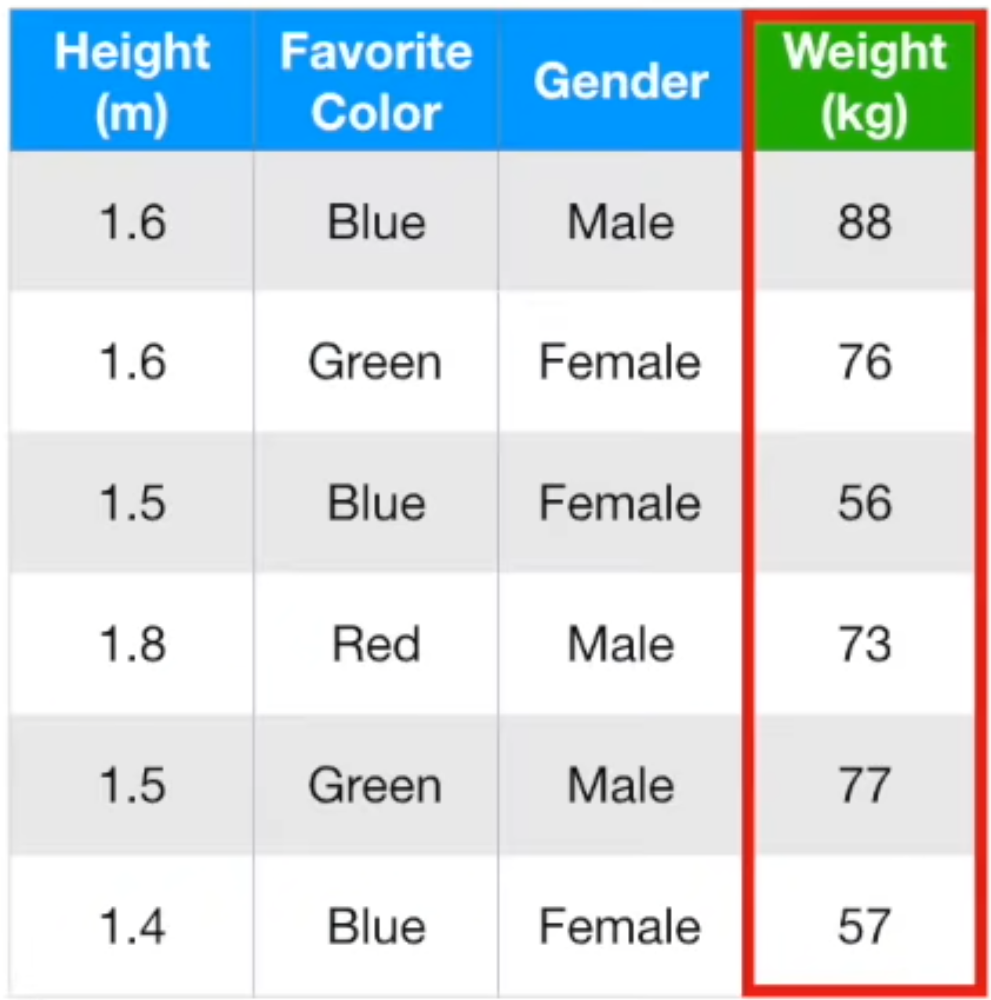

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/GBT-EX1.png', width=400,height=400)

In this example we are going to predict the weight of a person based on 3 features. Take a look at the data set.

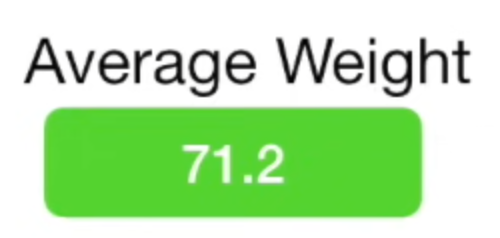

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/GBT-EX2.png', width=400,height=200)

We know that we have several different trees in this algorithm. The first one actually contains only one node which value is equal to the average of desired value in this case the weigths.

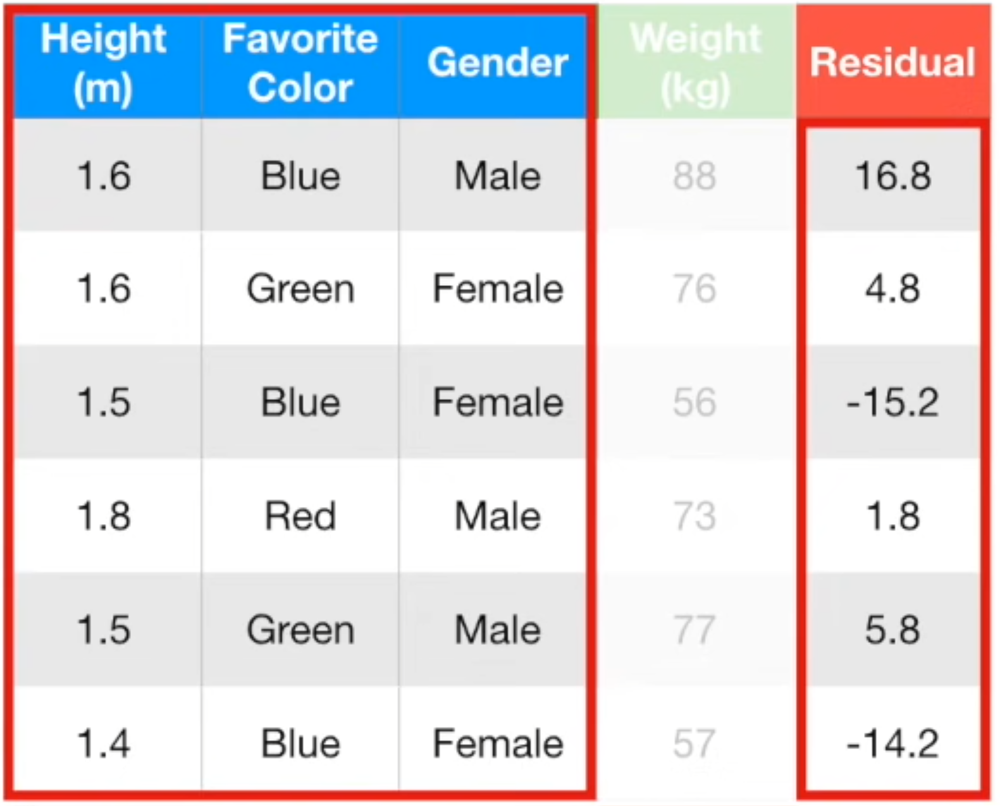

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/GBT-EX3.png', width=500,height=400)

Then we continue by calculating the residual of each data in the dataset. This basicaly tells us for any combination of features , How off is our predicted value based on the current tree.

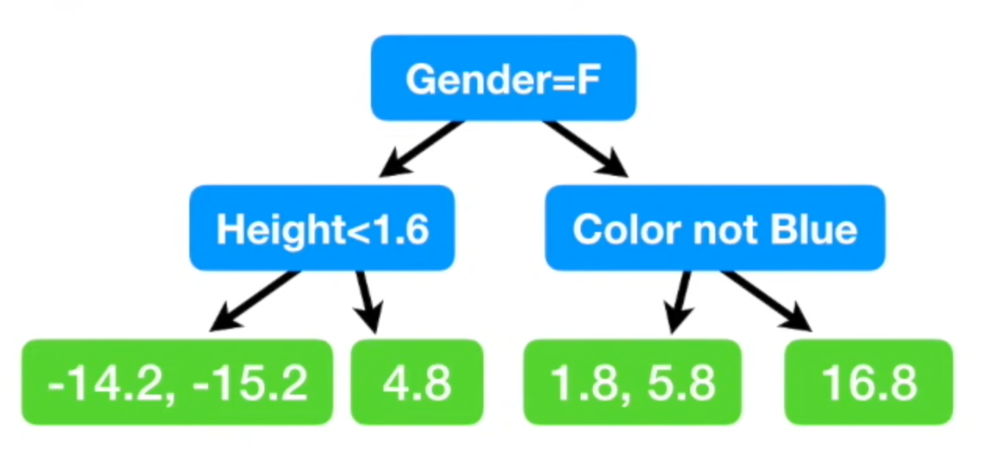

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/GBT-EX4.png', width=400,height=200)

Then we continue by constructing another tree. This time we don't care about the actual weights, and this tree is being constructed in order to lower the value of the residuals.

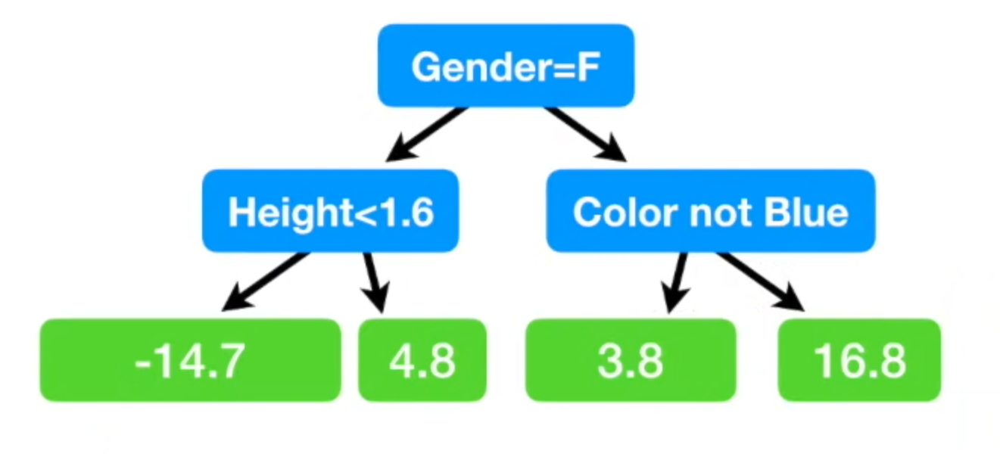

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/GBT-EX5.png', width=400,height=200)

For any leaf which contains more than one value we simply put the average of all values as it's actual value.

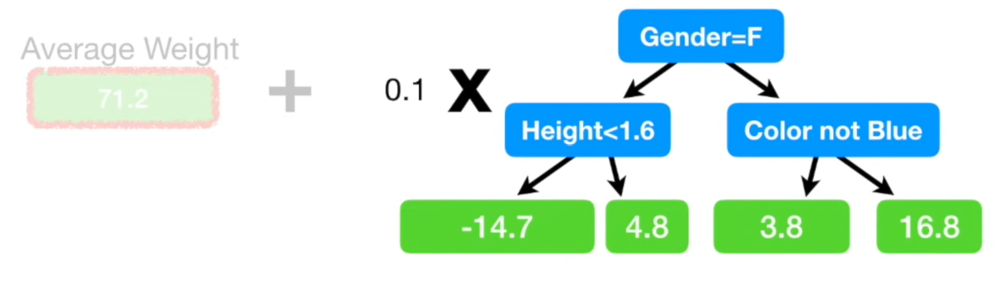

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/GBT-EX6.png', width=600,height=200)

Then to calculate new estimations we need all of the trees we have constructed until now. From the second tree , we see a hyperparameter that is actually the learning rate and helps us don't make big steps and make a more accurate model. So to make new predictions we will sum all the leafs that are related to each dataset considering learning rates.

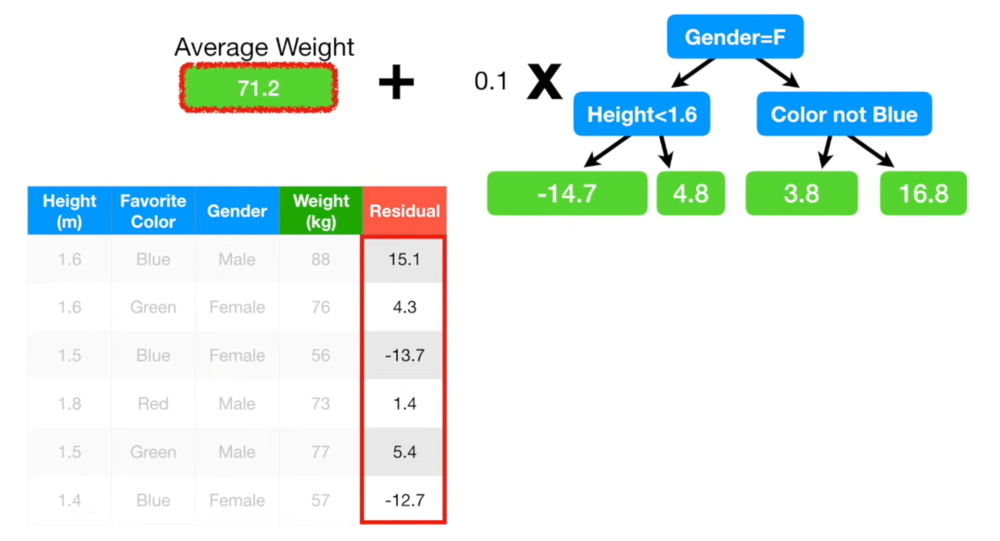

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/GBT-EX7.png', width=800,height=550)

Then using this new estimations, We can have new residuals as well. Logically this new residuals are all getting smaller as our purpose behind making a new tree was this. Then we continue in the same way with new trees. At last two things could happen. First one is after constructing n number of trees the residuals could not get lower so our model is compelete. Another thing that could happen is we can have a limit on the number of the total trees in the model and this limit could be reached.

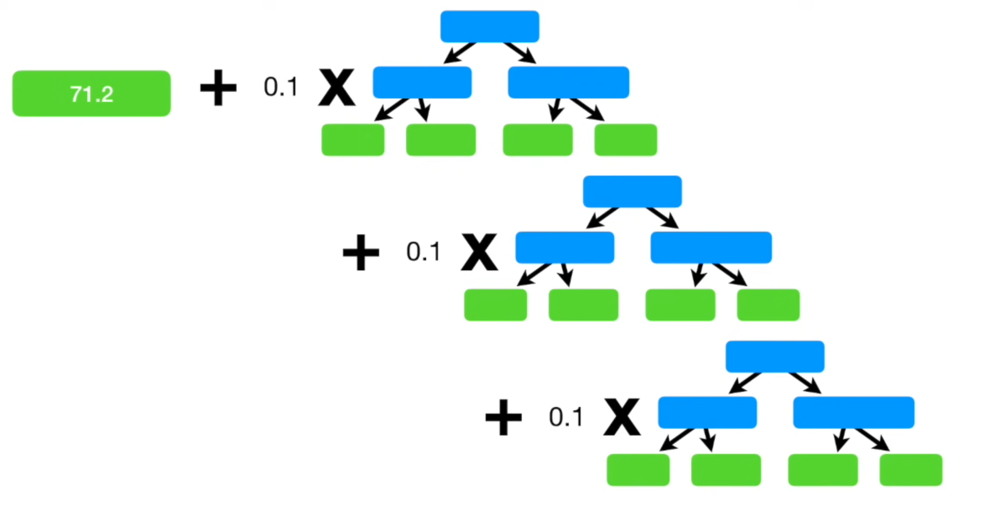

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/GBT-EX8.png', width=600,height=400)

Here we can see how 4 trees or in another prespective , 3 trees and one number can work together and make an estimation.

# **1.Import the necessary libraries for Gradient-Boosted Tree**

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.datasets import fetch_openml
boston = fetch_openml(name='boston', version=1)


/usr/local/lib/python3.10/dist-packages/sklearn/datasets/_openml.py:968: FutureWarning: The default value of `parser` will change from `'liac-arff'` to `'auto'` in 1.4. You can set `parser='auto'` to silence this warning. Therefore, an `ImportError` will be raised from 1.4 if the dataset is dense and pandas is not installed. Note that the pandas parser may return different data types. See the Notes Section in fetch_openml's API doc for details.
  warn(


In [ ]:
X = pd.DataFrame(boston.data, columns=boston.feature_names)
y = pd.Series(boston.target)

# **2.We do train test split**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y)

# **3. We use two nodes with three decision trees in GradientBoostingRegressor**

In [ ]:
regressor = GradientBoostingRegressor(
    max_depth=2,
    n_estimators=3,
    learning_rate=1.0
)
regressor.fit(X_train, y_train)

GradientBoostingRegressor(learning_rate=1.0, max_depth=2, n_estimators=3)

# **4. We compute the errors and the best estimators.**

In [ ]:
errors = [mean_squared_error(y_test, y_pred) for y_pred in regressor.staged_predict(X_test)]
best_n_estimators = np.argmin(errors)

In [ ]:
best_n_estimators

1

# **5. We use the best estimators and create our model.**




In [ ]:
best_regressor = GradientBoostingRegressor(
    max_depth=2,
    learning_rate=0.1
)
best_regressor.fit(X_train, y_train)

GradientBoostingRegressor(max_depth=2)

# **6. We predict our test set**


In [ ]:
y_pred = best_regressor.predict(X_test)

# **7. compute the mean absolute error.**

In [ ]:
mean_absolute_error(y_test, y_pred)

2.7146354540525444

# **Part IV**
#**Extreme Gradient Boosting(XGBoost)Algorithm**

# **XGBoost is one of the best gradient-boosted tree implementations currently available. Released on March 27, 2014, by Tianqi Chen as a research project, XGBoost has become the dominant machine learning algorithm for classification and regression. XGBoost was designed using the general principles of gradient boosting, combining weak learners into a strong learner. But while gradient-boosted trees are built sequentially – slowly learning from data to improve its prediction in succeeding iteration, XGBoost builds trees in parallel.XGBoost produces better prediction performance by controlling model complexity and reducing overfitting through its built-in regularization. XGBoost uses an approximate algorithm to find split points when finding the best split points for a continuous feature. The approximate splitting method uses discrete bins to bucket continuous features, significantly speeding up model training. XGBoost includes another tree growing method using a histogram-based algorithm which provides an even more efficient method of bucketing continuous features into discrete bins. But while the approximate method creates a new set of bins per iteration, the histogram-based approach reuses bins over multiple iterations. This approach allows for additional optimizations that are not achievable with the approximate method, such as the ability to cache bins and parent and sibling histogram subtraction. To optimize sorting operations, XGBoost stores sorted data in in-memory units of blocks. Sorting blocks can be efficiently distributed and performed by parallel CPU cores. XGBoost can effectively handle weighted data via its weighted quantile sketch algorithm, can efficiently handle sparse data, is cache-aware, and supports out-of-core computing by utilizing disk space for large datasets, so data does not have to fit in memory.**

## **Here we have an example of XGB algorithm to show how it works:**

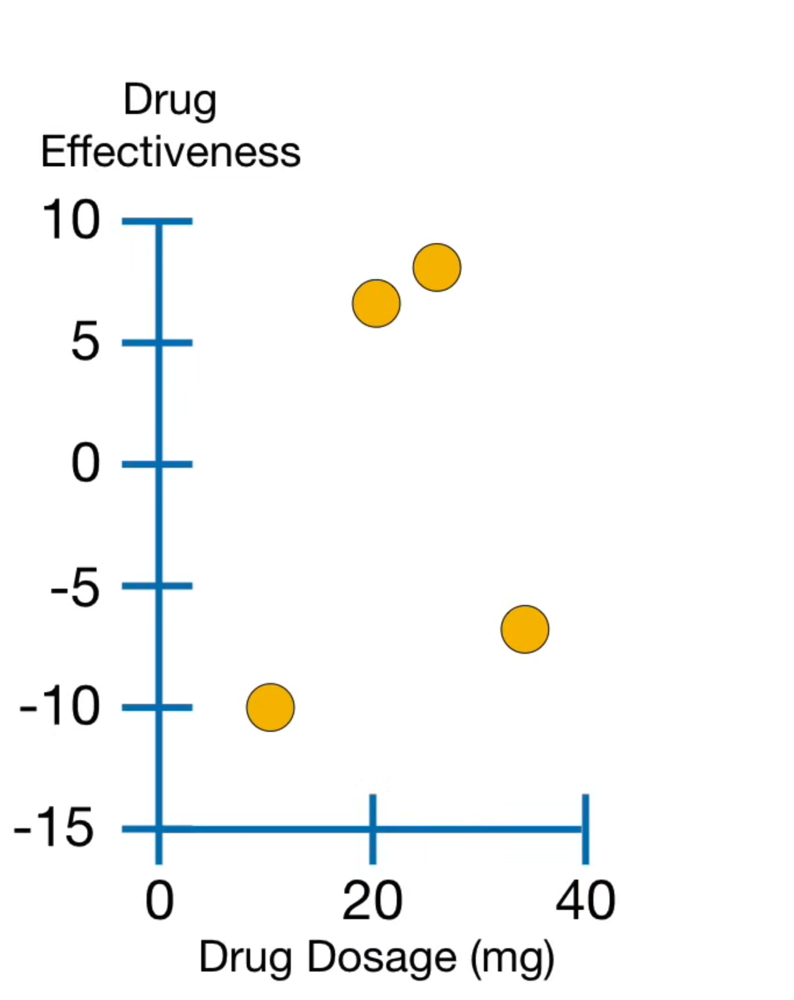

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/XGB-EX1.png', width=300,height=400)

In this example our goal is to predict the effectiveness of different medications based on the dosage. You can see the 2D graph in the picture.

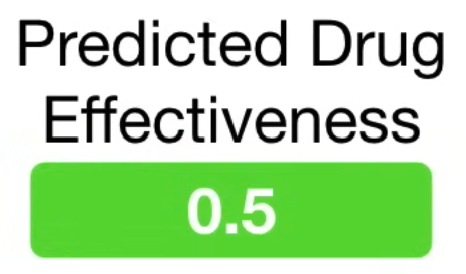

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/XGB-EX2.png', width=300,height=200)

In the first step we suppose that every drug has effectiveness of 0.5. It is a default value in both regression and classification problems using XGBoost although we can change it if we want as well.

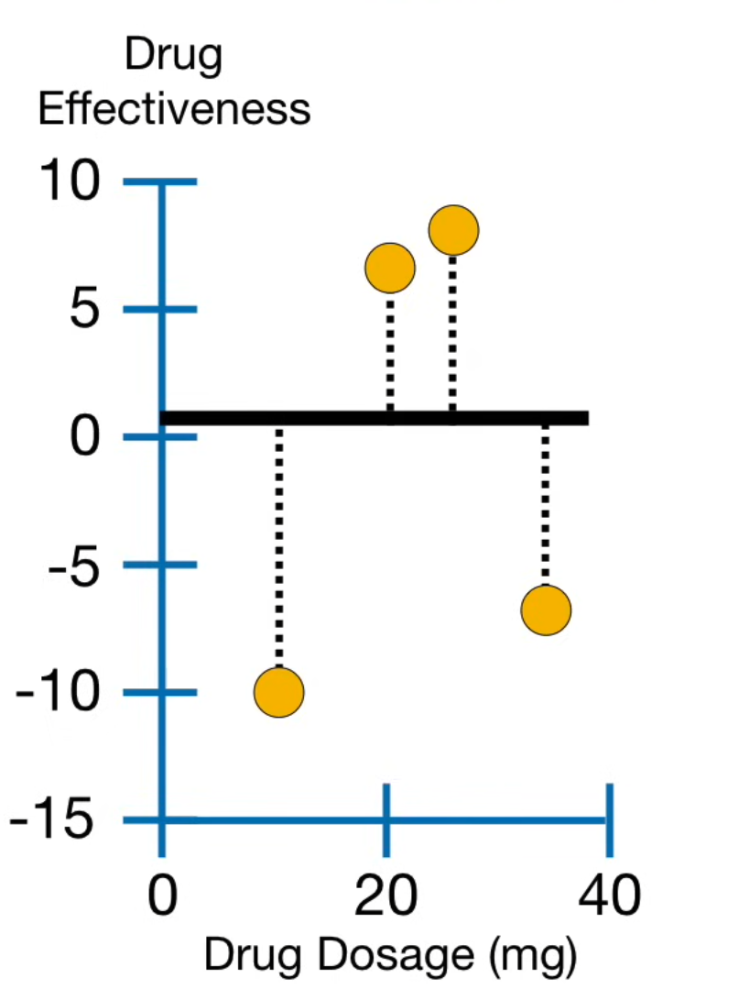

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/XGB-EX3.png', width=300,height=400)

In this plot the thick black line is 0.5 effectiveness and we will calculate the residuals based on this line. Our data effectiveness are [-10,7,8,-7]

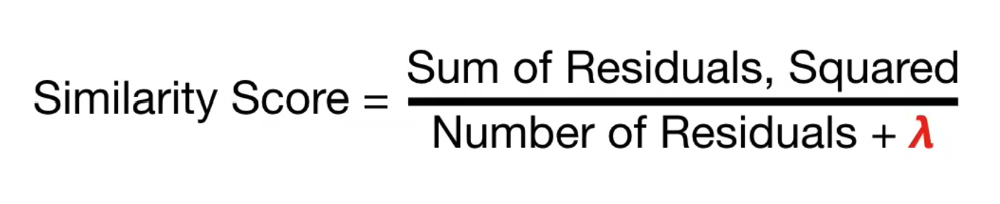

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/XGB-EX4.png', width=400,height=100)

Now we should introduce a value called similarity score. This value helps us to find  the best way to branch our tree. Lambda is a hyperparameter which helps in regularization and prevent the model be based on the observations only. In this example we suppose it is 0 but it's not 0 in real world applications.

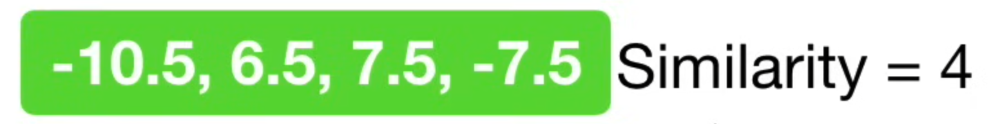

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/XGB-EX5.png', width=450,height=100)

In the first node or root of our XGBoost tree we have all the datas. Then we will calculate the similarity score of these data. Sum of them is equal to 4. We calculate it to power of 2 and then devide it by the number of datas which equals to 4 at last.

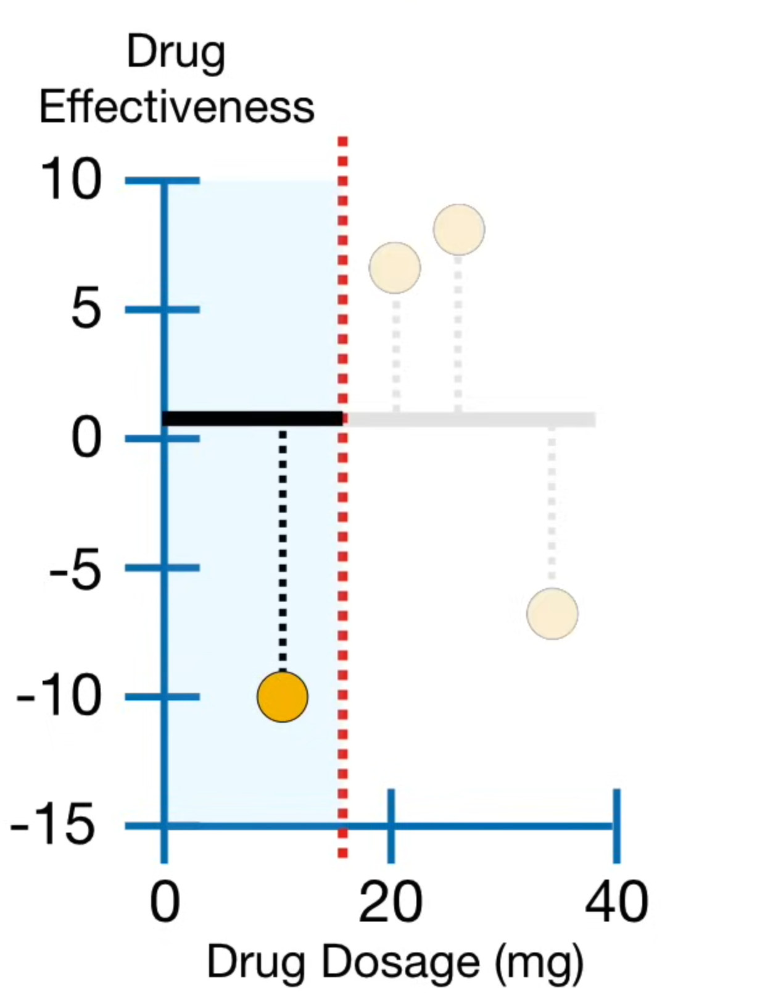

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/XGB-EX6.png', width=300,height=400)

Now we should think of a way to seperate our data. We have different options. In this algorithm we calculate the scores for all the available options and then we pick the best out of them. Suppose we have a seperation as shown in this picture.

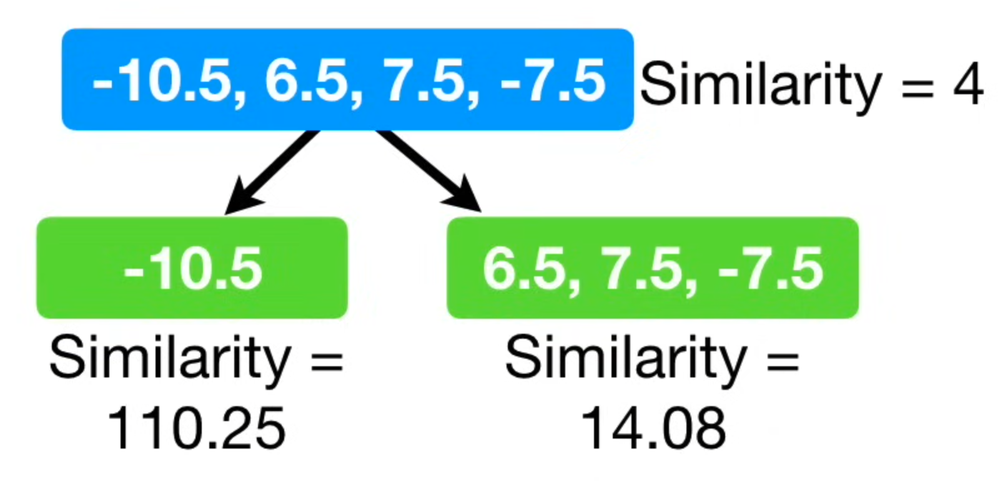

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/XGB-EX7.png', width=600,height=400)

We devide the root into two branches using the mentioned seperation. Then we should calculate the similarity score for these new branches.

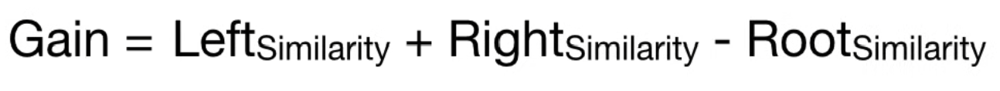

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/XGB-EX8.png', width=450,height=80)

Here we introduce another score which gives us a hint about how good our branching was. This Gain score is calculated by summing the new branches similarity scores and substracting the parent node similarity score from it. This branching gain is somthing near 120.

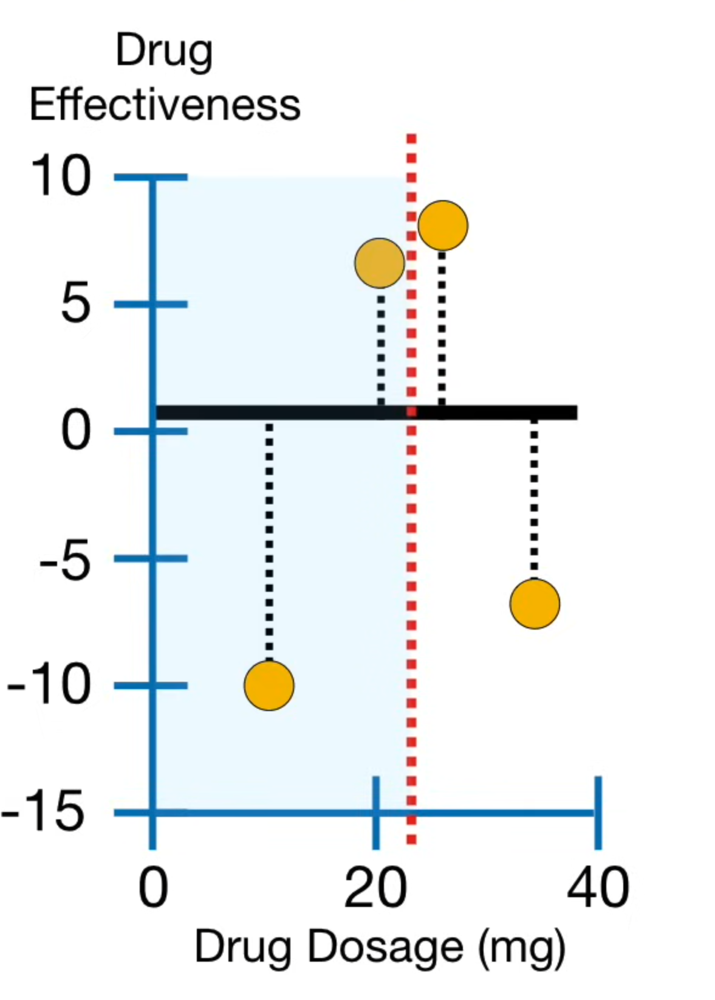

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/XGB-EX9.png', width=300,height=400)

Now we want to check other options. Here is another branching possibility.

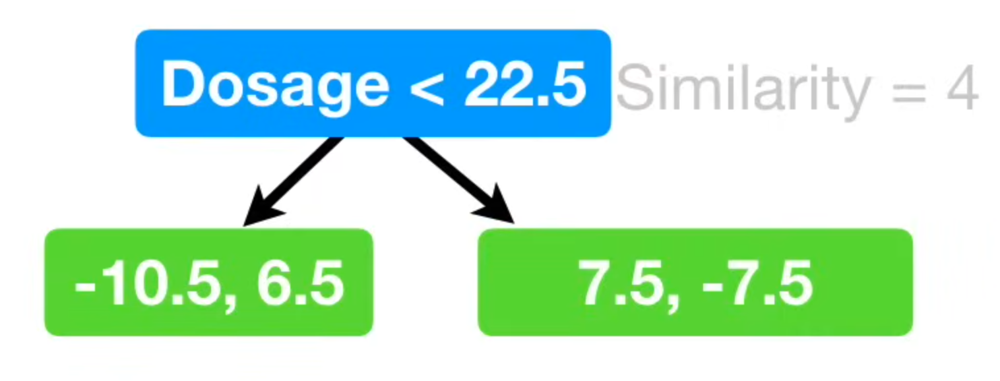

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/XGB-EX10.png', width=600,height=400)

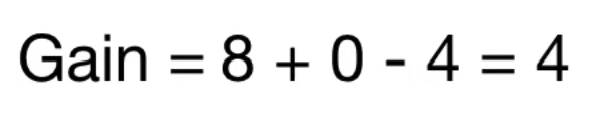

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/XGB-EX11.png', width=400,height=100)

After calculating the gain for this branching as well we can see it's gain is far less than the first option. We can say the first branching was a better one. Another branching is left to check which in the end, it's score is less than the first one as well. So we can conclude that the first one was the best branching possible and we fix it in place.

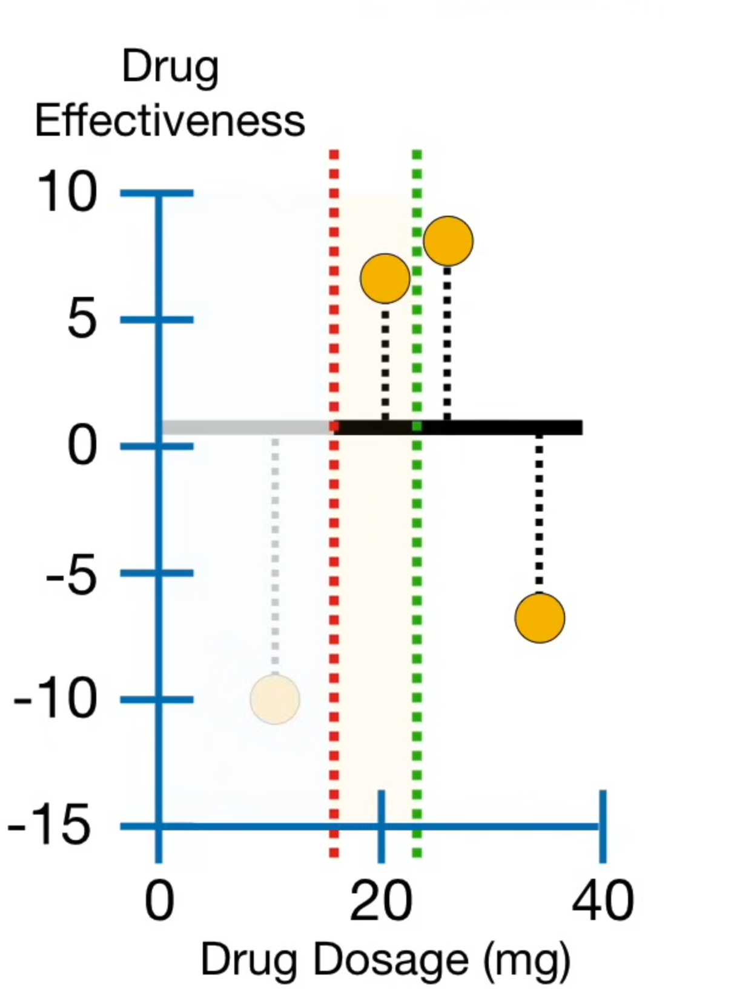

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/XGB-EX12.png', width=300,height=400)

The red line shows the fixed branching. Now as we know there are several datas in one of the leafs so we can check the new branching options.

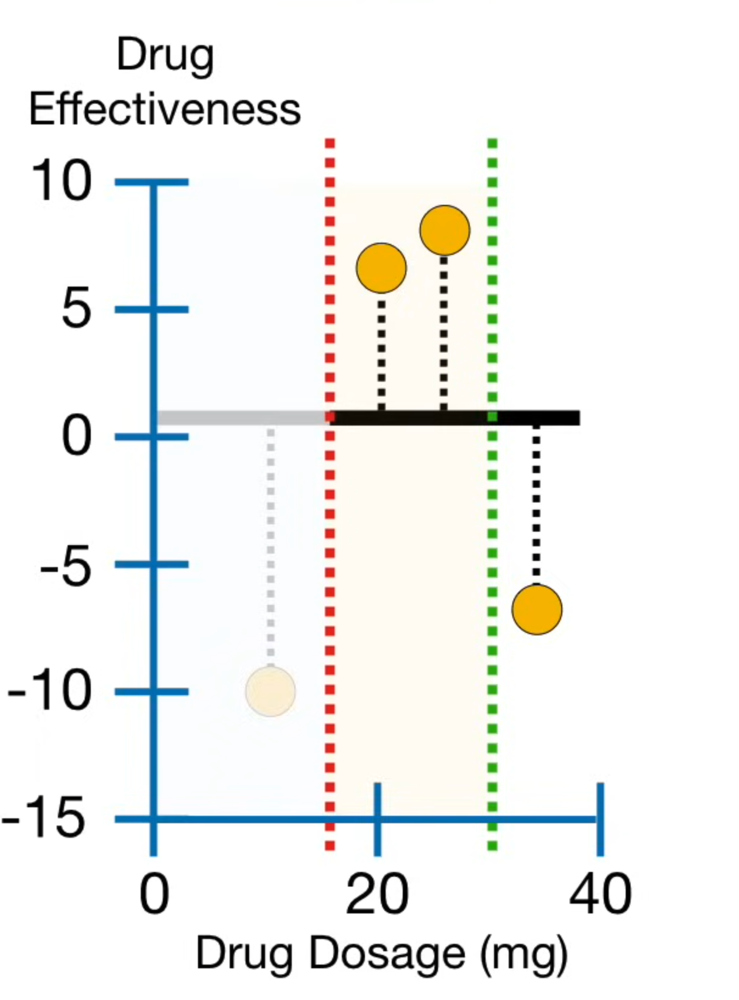

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/XGB-EX13.png', width=300,height=400)

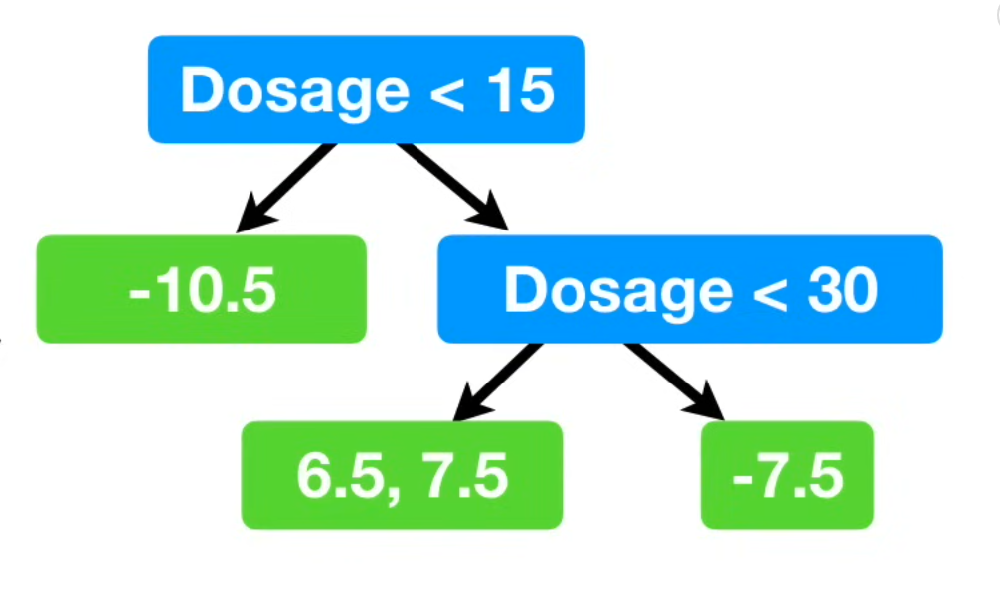

In [ ]:
Image(filename='/content/drive/MyDrive/AI-Assignment2/XGB-EX14.png', width=600,height=400)

After checking all and calculating the gains, we reach this tree. We can go further but the limit that we had put on the tree depth is 2 so we finish the job here. In this tree any drug which effectiveness is between 15 and 30 are effective(has a positive effectiveness. We can use this algorithm for regression as well the same way we had observed in the regression tree in the last projects.

#**Import the necessary libraries for XGBoost Example**

In [ ]:
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import balanced_accuracy_score, roc_auc_score, make_scorer
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay


# **2. Import the data**


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/AI-Assignment2/Telcom.csv')

In [ ]:
df.head()

,CustomerID,Count,Country,State,City,Zip Code,Lat Long,Latitude,Longitude,Gender,...,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Label,Churn Value,Churn Score,CLTV,Churn Reason
0,3668-QPYBK,1,United States,California,Los Angeles,90003,"33.964131, -118.272783",33.964131,-118.272783,Male,...,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,1,86,3239,Competitor made better offer
1,9237-HQITU,1,United States,California,Los Angeles,90005,"34.059281, -118.30742",34.059281,-118.307420,Female,...,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,1,67,2701,Moved
2,9305-CDSKC,1,United States,California,Los Angeles,90006,"34.048013, -118.293953",34.048013,-118.293953,Female,...,Month-to-month,Yes,Electronic check,99.65,820.5,Yes,1,86,5372,Moved
3,7892-POOKP,1,United States,California,Los Angeles,90010,"34.062125, -118.315709",34.062125,-118.315709,Female,...,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes,1,84,5003,Moved
4,0280-XJGEX,1,United States,California,Los Angeles,90015,"34.039224, -118.266293",34.039224,-118.266293,Male,...,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,Yes,1,89,5340,Competitor had better devices


# **3. Data exploration**

In [ ]:
df.drop(['Churn Label', 'Churn Score', 'CLTV', 'Churn Reason'],
        axis=1, inplace=True)
df.head()

,CustomerID,Count,Country,State,City,Zip Code,Lat Long,Latitude,Longitude,Gender,...,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Value
0,3668-QPYBK,1,United States,California,Los Angeles,90003,"33.964131, -118.272783",33.964131,-118.272783,Male,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,1
1,9237-HQITU,1,United States,California,Los Angeles,90005,"34.059281, -118.30742",34.059281,-118.307420,Female,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,1
2,9305-CDSKC,1,United States,California,Los Angeles,90006,"34.048013, -118.293953",34.048013,-118.293953,Female,...,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,1
3,7892-POOKP,1,United States,California,Los Angeles,90010,"34.062125, -118.315709",34.062125,-118.315709,Female,...,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,1
4,0280-XJGEX,1,United States,California,Los Angeles,90015,"34.039224, -118.266293",34.039224,-118.266293,Male,...,Yes,No,Yes,Yes,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,1


In [ ]:
df['Count'].unique()

array([1])

In [ ]:
df['Country'].unique()

array(['United States'], dtype=object)

In [ ]:
df['State'].unique()

array(['California'], dtype=object)

In [ ]:
df['City'].unique()

array(['Los Angeles', 'Beverly Hills', 'Huntington Park', ..., 'Standish',
       'Tulelake', 'Olympic Valley'], dtype=object)

In [ ]:
df.drop(['CustomerID', 'Count', 'Country', 'State', 'Lat Long'],
        axis=1, inplace=True)
df.head()

,City,Zip Code,Latitude,Longitude,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,...,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Value
0,Los Angeles,90003,33.964131,-118.272783,Male,No,No,No,2,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,1
1,Los Angeles,90005,34.059281,-118.307420,Female,No,No,Yes,2,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,1
2,Los Angeles,90006,34.048013,-118.293953,Female,No,No,Yes,8,Yes,...,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,1
3,Los Angeles,90010,34.062125,-118.315709,Female,No,Yes,Yes,28,Yes,...,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,1
4,Los Angeles,90015,34.039224,-118.266293,Male,No,No,Yes,49,Yes,...,Yes,No,Yes,Yes,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,1


In [ ]:
df['City'].replace(' ', '_', regex=True, inplace=True)
df.head()

,City,Zip Code,Latitude,Longitude,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,...,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Value
0,Los_Angeles,90003,33.964131,-118.272783,Male,No,No,No,2,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,1
1,Los_Angeles,90005,34.059281,-118.307420,Female,No,No,Yes,2,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,1
2,Los_Angeles,90006,34.048013,-118.293953,Female,No,No,Yes,8,Yes,...,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,1
3,Los_Angeles,90010,34.062125,-118.315709,Female,No,Yes,Yes,28,Yes,...,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,1
4,Los_Angeles,90015,34.039224,-118.266293,Male,No,No,Yes,49,Yes,...,Yes,No,Yes,Yes,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,1


In [ ]:
df['City'].unique()[0:10]

array(['Los_Angeles', 'Beverly_Hills', 'Huntington_Park', 'Lynwood',
       'Marina_Del_Rey', 'Inglewood', 'Santa_Monica', 'Torrance',
       'Whittier', 'La_Habra'], dtype=object)

In [ ]:
df.columns = df.columns.str.replace(' ', '_')
df.head()

,City,Zip_Code,Latitude,Longitude,Gender,Senior_Citizen,Partner,Dependents,Tenure_Months,Phone_Service,...,Device_Protection,Tech_Support,Streaming_TV,Streaming_Movies,Contract,Paperless_Billing,Payment_Method,Monthly_Charges,Total_Charges,Churn_Value
0,Los_Angeles,90003,33.964131,-118.272783,Male,No,No,No,2,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,1
1,Los_Angeles,90005,34.059281,-118.307420,Female,No,No,Yes,2,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,1
2,Los_Angeles,90006,34.048013,-118.293953,Female,No,No,Yes,8,Yes,...,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,1
3,Los_Angeles,90010,34.062125,-118.315709,Female,No,Yes,Yes,28,Yes,...,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,1
4,Los_Angeles,90015,34.039224,-118.266293,Male,No,No,Yes,49,Yes,...,Yes,No,Yes,Yes,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,1


In [ ]:
df.dtypes

City                  object
Zip_Code               int64
Latitude             float64
Longitude            float64
Gender                object
Senior_Citizen        object
Partner               object
Dependents            object
Tenure_Months          int64
Phone_Service         object
Multiple_Lines        object
Internet_Service      object
Online_Security       object
Online_Backup         object
Device_Protection     object
Tech_Support          object
Streaming_TV          object
Streaming_Movies      object
Contract              object
Paperless_Billing     object
Payment_Method        object
Monthly_Charges      float64
Total_Charges         object
Churn_Value            int64
dtype: object

In [ ]:
df['Phone_Service'].unique()

array(['Yes', 'No'], dtype=object)

In [ ]:
df['Total_Charges'].unique()

array(['108.15', '151.65', '820.5', ..., '7362.9', '346.45', '6844.5'],
      dtype=object)

In [ ]:
len(df.loc[df['Total_Charges'] == ' '])

11

In [ ]:
df.loc[df['Total_Charges'] == ' ']

,City,Zip_Code,Latitude,Longitude,Gender,Senior_Citizen,Partner,Dependents,Tenure_Months,Phone_Service,...,Device_Protection,Tech_Support,Streaming_TV,Streaming_Movies,Contract,Paperless_Billing,Payment_Method,Monthly_Charges,Total_Charges,Churn_Value
2234,San_Bernardino,92408,34.084909,-117.258107,Female,No,Yes,No,0,No,...,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,,0
2438,Independence,93526,36.869584,-118.189241,Male,No,No,No,0,Yes,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,,0
2568,San_Mateo,94401,37.590421,-122.306467,Female,No,Yes,No,0,Yes,...,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,,0
2667,Cupertino,95014,37.306612,-122.080621,Male,No,Yes,Yes,0,Yes,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,,0
2856,Redcrest,95569,40.363446,-123.835041,Female,No,Yes,No,0,No,...,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,,0
4331,Los_Angeles,90029,34.089953,-118.294824,Male,No,Yes,Yes,0,Yes,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,,0
4687,Sun_City,92585,33.739412,-117.173334,Male,No,Yes,Yes,0,Yes,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,,0
5104,Ben_Lomond,95005,37.078873,-122.090386,Female,No,Yes,Yes,0,Yes,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,,0
5719,La_Verne,91750,34.144703,-117.770299,Male,No,Yes,Yes,0,Yes,...,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,,0
6772,Bell,90201,33.970343,-118.171368,Female,No,Yes,Yes,0,Yes,...,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,,0


In [ ]:
df.loc[(df['Total_Charges'] == ' '), 'Total_Charges'] = 0

In [ ]:
df.loc[df['Tenure_Months'] == 0]

,City,Zip_Code,Latitude,Longitude,Gender,Senior_Citizen,Partner,Dependents,Tenure_Months,Phone_Service,...,Device_Protection,Tech_Support,Streaming_TV,Streaming_Movies,Contract,Paperless_Billing,Payment_Method,Monthly_Charges,Total_Charges,Churn_Value
2234,San_Bernardino,92408,34.084909,-117.258107,Female,No,Yes,No,0,No,...,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,0,0
2438,Independence,93526,36.869584,-118.189241,Male,No,No,No,0,Yes,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,0,0
2568,San_Mateo,94401,37.590421,-122.306467,Female,No,Yes,No,0,Yes,...,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,0,0
2667,Cupertino,95014,37.306612,-122.080621,Male,No,Yes,Yes,0,Yes,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,0,0
2856,Redcrest,95569,40.363446,-123.835041,Female,No,Yes,No,0,No,...,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,0,0
4331,Los_Angeles,90029,34.089953,-118.294824,Male,No,Yes,Yes,0,Yes,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,0,0
4687,Sun_City,92585,33.739412,-117.173334,Male,No,Yes,Yes,0,Yes,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,0,0
5104,Ben_Lomond,95005,37.078873,-122.090386,Female,No,Yes,Yes,0,Yes,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,0,0
5719,La_Verne,91750,34.144703,-117.770299,Male,No,Yes,Yes,0,Yes,...,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,0,0
6772,Bell,90201,33.970343,-118.171368,Female,No,Yes,Yes,0,Yes,...,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,0,0


In [ ]:
df['Total_Charges'] = pd.to_numeric(df['Total_Charges'])
df.dtypes

City                  object
Zip_Code               int64
Latitude             float64
Longitude            float64
Gender                object
Senior_Citizen        object
Partner               object
Dependents            object
Tenure_Months          int64
Phone_Service         object
Multiple_Lines        object
Internet_Service      object
Online_Security       object
Online_Backup         object
Device_Protection     object
Tech_Support          object
Streaming_TV          object
Streaming_Movies      object
Contract              object
Paperless_Billing     object
Payment_Method        object
Monthly_Charges      float64
Total_Charges        float64
Churn_Value            int64
dtype: object

In [ ]:
df.replace(' ', '_', regex=True, inplace=True)
df.head()

,City,Zip_Code,Latitude,Longitude,Gender,Senior_Citizen,Partner,Dependents,Tenure_Months,Phone_Service,...,Device_Protection,Tech_Support,Streaming_TV,Streaming_Movies,Contract,Paperless_Billing,Payment_Method,Monthly_Charges,Total_Charges,Churn_Value
0,Los_Angeles,90003,33.964131,-118.272783,Male,No,No,No,2,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed_check,53.85,108.15,1
1,Los_Angeles,90005,34.059281,-118.307420,Female,No,No,Yes,2,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic_check,70.70,151.65,1
2,Los_Angeles,90006,34.048013,-118.293953,Female,No,No,Yes,8,Yes,...,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic_check,99.65,820.50,1
3,Los_Angeles,90010,34.062125,-118.315709,Female,No,Yes,Yes,28,Yes,...,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic_check,104.80,3046.05,1
4,Los_Angeles,90015,34.039224,-118.266293,Male,No,No,Yes,49,Yes,...,Yes,No,Yes,Yes,Month-to-month,Yes,Bank_transfer_(automatic),103.70,5036.30,1


In [ ]:
df.size

169032

# **4. Split our data**


In [ ]:
X = df.drop('Churn_Value', axis=1).copy()
X.head()

,City,Zip_Code,Latitude,Longitude,Gender,Senior_Citizen,Partner,Dependents,Tenure_Months,Phone_Service,...,Online_Backup,Device_Protection,Tech_Support,Streaming_TV,Streaming_Movies,Contract,Paperless_Billing,Payment_Method,Monthly_Charges,Total_Charges
0,Los_Angeles,90003,33.964131,-118.272783,Male,No,No,No,2,Yes,...,Yes,No,No,No,No,Month-to-month,Yes,Mailed_check,53.85,108.15
1,Los_Angeles,90005,34.059281,-118.307420,Female,No,No,Yes,2,Yes,...,No,No,No,No,No,Month-to-month,Yes,Electronic_check,70.70,151.65
2,Los_Angeles,90006,34.048013,-118.293953,Female,No,No,Yes,8,Yes,...,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic_check,99.65,820.50
3,Los_Angeles,90010,34.062125,-118.315709,Female,No,Yes,Yes,28,Yes,...,No,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic_check,104.80,3046.05
4,Los_Angeles,90015,34.039224,-118.266293,Male,No,No,Yes,49,Yes,...,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Bank_transfer_(automatic),103.70,5036.30


In [ ]:
y = df['Churn_Value'].copy()
y.head()

0    1
1    1
2    1
3    1
4    1
Name: Churn_Value, dtype: int64


# **5. We format the data with One-Hot Encoding**



In [ ]:
X.dtypes

City                  object
Zip_Code               int64
Latitude             float64
Longitude            float64
Gender                object
Senior_Citizen        object
Partner               object
Dependents            object
Tenure_Months          int64
Phone_Service         object
Multiple_Lines        object
Internet_Service      object
Online_Security       object
Online_Backup         object
Device_Protection     object
Tech_Support          object
Streaming_TV          object
Streaming_Movies      object
Contract              object
Paperless_Billing     object
Payment_Method        object
Monthly_Charges      float64
Total_Charges        float64
dtype: object

In [ ]:
pd.get_dummies(X, columns=['Payment_Method']).head()

,City,Zip_Code,Latitude,Longitude,Gender,Senior_Citizen,Partner,Dependents,Tenure_Months,Phone_Service,...,Streaming_TV,Streaming_Movies,Contract,Paperless_Billing,Monthly_Charges,Total_Charges,Payment_Method_Bank_transfer_(automatic),Payment_Method_Credit_card_(automatic),Payment_Method_Electronic_check,Payment_Method_Mailed_check
0,Los_Angeles,90003,33.964131,-118.272783,Male,No,No,No,2,Yes,...,No,No,Month-to-month,Yes,53.85,108.15,False,False,False,True
1,Los_Angeles,90005,34.059281,-118.307420,Female,No,No,Yes,2,Yes,...,No,No,Month-to-month,Yes,70.70,151.65,False,False,True,False
2,Los_Angeles,90006,34.048013,-118.293953,Female,No,No,Yes,8,Yes,...,Yes,Yes,Month-to-month,Yes,99.65,820.50,False,False,True,False
3,Los_Angeles,90010,34.062125,-118.315709,Female,No,Yes,Yes,28,Yes,...,Yes,Yes,Month-to-month,Yes,104.80,3046.05,False,False,True,False
4,Los_Angeles,90015,34.039224,-118.266293,Male,No,No,Yes,49,Yes,...,Yes,Yes,Month-to-month,Yes,103.70,5036.30,True,False,False,False


In [ ]:
X_encoded = pd.get_dummies(X, columns=['City',
                                       'Gender',
                                       'Senior_Citizen',
                                       'Partner',
                                       'Dependents',
                                       'Phone_Service',
                                       'Multiple_Lines',
                                       'Internet_Service',
                                       'Online_Security',
                                       'Online_Backup',
                                       'Device_Protection',
                                       'Tech_Support',
                                       'Streaming_TV',
                                       'Streaming_Movies',
                                       'Contract',
                                       'Paperless_Billing',
                                       'Payment_Method'])
X_encoded.head()

,Zip_Code,Latitude,Longitude,Tenure_Months,Monthly_Charges,Total_Charges,City_Acampo,City_Acton,City_Adelanto,City_Adin,...,Streaming_Movies_Yes,Contract_Month-to-month,Contract_One_year,Contract_Two_year,Paperless_Billing_No,Paperless_Billing_Yes,Payment_Method_Bank_transfer_(automatic),Payment_Method_Credit_card_(automatic),Payment_Method_Electronic_check,Payment_Method_Mailed_check
0,90003,33.964131,-118.272783,2,53.85,108.15,False,False,False,False,...,False,True,False,False,False,True,False,False,False,True
1,90005,34.059281,-118.307420,2,70.70,151.65,False,False,False,False,...,False,True,False,False,False,True,False,False,True,False
2,90006,34.048013,-118.293953,8,99.65,820.50,False,False,False,False,...,True,True,False,False,False,True,False,False,True,False
3,90010,34.062125,-118.315709,28,104.80,3046.05,False,False,False,False,...,True,True,False,False,False,True,False,False,True,False
4,90015,34.039224,-118.266293,49,103.70,5036.30,False,False,False,False,...,True,True,False,False,False,True,True,False,False,False


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, random_state=42, stratify=y)


# **6.We Optimize our hyperparameters by Cross-Validation and GridSearch.**


In [ ]:
param_grid = {
     'max_depth': [4],
     'learning_rate': [0.1, 0.5, 0.08],
     'gamma': [0.25],
     'reg_lambda': [10.0, 20, 100],
      'scale_pos_weight': [3]}

optimal_params = GridSearchCV(
     estimator=xgb.XGBClassifier(objective='binary:logistic',
                                 eval_metric="logloss",
                                 seed=42,
                                 subsample=0.9,
                                 colsample_bytree=0.5,
                                 early_stopping_rounds=8,
                                 use_label_encoder=False),
     param_grid=param_grid,
     scoring='roc_auc',
     verbose=0,
     n_jobs = 10,
     cv = 3,
 )

In [ ]:
optimal_params.fit(X_train,
                    y_train,
                    eval_set=[(X_test, y_test)],
                    verbose=False)

GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=0.5, device=None,
                                     early_stopping_rounds=8,
                                     enable_categorical=False,
                                     eval_metric='logloss', feature_types=None,
                                     gamma=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             n_jobs=10,
             param_grid={'gamma': [0.25], 'learning_rate': [0.1, 0.5, 0.08],
                         'max_depth': [4], 'reg_lambda': [10.0, 20, 100],
                         'scale_pos_weight': [3]},
             scoring='roc_auc')

In [ ]:
print(optimal_params.best_params_)

{'gamma': 0.25, 'learning_rate': 0.08, 'max_depth': 4, 'reg_lambda': 20, 'scale_pos_weight': 3}


#**Our best hyperparameters:**

## **gamma: 0.25**
## **learning_rate : 0.08**
## **max_depth: 4**
## **reg_lambda: 20.0**
## **scale_pos_weight: 3**



# **7. We now build our XGBoost Model**



In [ ]:
clf_xgb = xgb.XGBClassifier(seed=42,
                        objective='binary:logistic',
                        eval_metric="logloss",
                        gamma=0.25,
                        learning_rate=0.08,
                        max_depth=4,
                        reg_lambda=20,
                        scale_pos_weight=3,
                        subsample=0.9,
                        colsample_bytree=0.5,
                        use_label_encoder=False,
                         early_stopping_rounds=20,
)
clf_xgb.fit(X_train,
            y_train,
            verbose=True,
            eval_set=[(X_test, y_test)])

[0]	validation_0-logloss:0.68782
[1]	validation_0-logloss:0.66622
[2]	validation_0-logloss:0.64672
[3]	validation_0-logloss:0.63075
[4]	validation_0-logloss:0.61626
[5]	validation_0-logloss:0.60224
[6]	validation_0-logloss:0.59101
[7]	validation_0-logloss:0.58037
[8]	validation_0-logloss:0.57070
[9]	validation_0-logloss:0.56252
[10]	validation_0-logloss:0.55552
[11]	validation_0-logloss:0.54818
[12]	validation_0-logloss:0.54240
[13]	validation_0-logloss:0.53700
[14]	validation_0-logloss:0.53221
[15]	validation_0-logloss:0.52808
[16]	validation_0-logloss:0.52477
[17]	validation_0-logloss:0.52108
[18]	validation_0-logloss:0.51728
[19]	validation_0-logloss:0.51360
[20]	validation_0-logloss:0.51080
[21]	validation_0-logloss:0.50803
[22]	validation_0-logloss:0.50527
[23]	validation_0-logloss:0.50299
[24]	validation_0-logloss:0.50083
[25]	validation_0-logloss:0.49929
[26]	validation_0-logloss:0.49772
[27]	validation_0-logloss:0.49577
[28]	validation_0-logloss:0.49381
[29]	validation_0-loglos

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.5, device=None, early_stopping_rounds=20,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=0.25, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.08, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=4,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, random_state=None, ...)

# **8. We test our XGBoost Model**

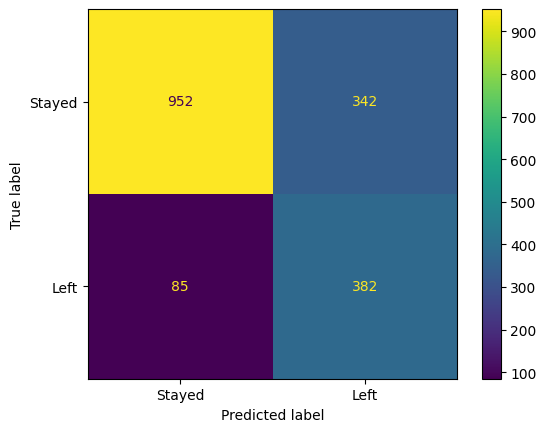

In [ ]:
ConfusionMatrixDisplay.from_estimator(clf_xgb,
                      X_test,
                      y_test,
                     values_format='d',
                      display_labels=["Stayed", "Left"])

In [ ]:
! pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.5/540.5 kB 13.4 MB/s eta 0:00:00


In [ ]:
import shap

In [ ]:
clf_xgb = xgb.XGBClassifier(seed=42,
                        objective='binary:logistic',
                        eval_metric="logloss",
                        gamma=0.25,
                        learning_rate=0.08,
                        max_depth=4,
                        reg_lambda=20,
                        scale_pos_weight=3,
                        subsample=0.9,
                        colsample_bytree=0.5,
                        use_label_encoder=False,
                        early_stopping_rounds=10,
                            )
clf_xgb.fit(X_train,
            y_train,
            verbose=True,


            eval_set=[(X_test, y_test)])

[0]	validation_0-logloss:0.68782
[1]	validation_0-logloss:0.66622
[2]	validation_0-logloss:0.64672
[3]	validation_0-logloss:0.63075
[4]	validation_0-logloss:0.61626
[5]	validation_0-logloss:0.60224
[6]	validation_0-logloss:0.59101
[7]	validation_0-logloss:0.58037
[8]	validation_0-logloss:0.57070
[9]	validation_0-logloss:0.56252
[10]	validation_0-logloss:0.55552
[11]	validation_0-logloss:0.54818
[12]	validation_0-logloss:0.54240
[13]	validation_0-logloss:0.53700
[14]	validation_0-logloss:0.53221
[15]	validation_0-logloss:0.52808
[16]	validation_0-logloss:0.52477
[17]	validation_0-logloss:0.52108
[18]	validation_0-logloss:0.51728
[19]	validation_0-logloss:0.51360
[20]	validation_0-logloss:0.51080
[21]	validation_0-logloss:0.50803
[22]	validation_0-logloss:0.50527
[23]	validation_0-logloss:0.50299
[24]	validation_0-logloss:0.50083
[25]	validation_0-logloss:0.49929
[26]	validation_0-logloss:0.49772
[27]	validation_0-logloss:0.49577
[28]	validation_0-logloss:0.49381
[29]	validation_0-loglos

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.5, device=None, early_stopping_rounds=10,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=0.25, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.08, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=4,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, random_state=None, ...)

In [ ]:
explainer = shap.Explainer(clf_xgb)
shap_values = explainer(X_test)

# **9.The most important features**

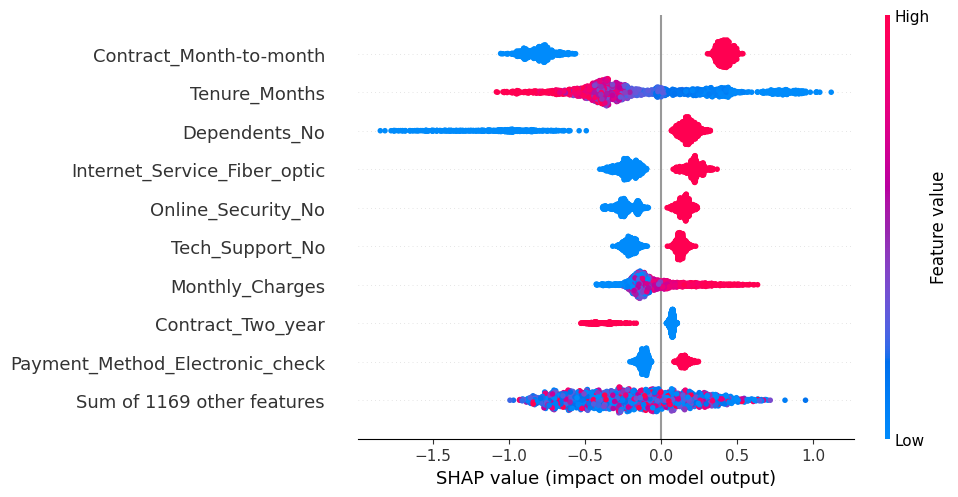

In [ ]:
shap.plots.beeswarm(shap_values)

# **References:**
#**[1].Data Structures, Algorithms, and Machine Learning Optimization, Jon Krohn-June 2021.**
#**[2]. Machine Learning With Go, Daniel Whitenack- September 2017.**
#**[3].Machine Learning with scikit-learn Quick Start Guide, Kevin Jolly-October 2018.**
#**[4].GitHub**
#**[5].statQuest Youtube channel**
#**[6].Simplilearn Youtube channel**


